 # <font color = red>Study Title: Predicting Psychological Distress in a Sample of First Year Psychology Students! </font>

 # <font color = blue>Table of Contents </font>
 <br>

[Study Aims](#1)<br>
[Dataset Information](#2)<br>
[Importing the Libraries](#3)<br>
[Importing the Dataset](#4)<br>
[Exploratory Data Analyses](#5)<br>
[Data Preparation](#6)<br>
[Model 1: Multiple Linear Regression with Statsmodel](#9)<br>
[Model 1: Multiple Linear Regression with Sklearn](#10)<br>
[Applying Polynomial Features to Multiple Linear Regression](#11)<br>
[Model 2: Ridge Regression Model](#12)<br>
[Applying Polynomial Features to the Ridge Regression Model](#13)<br>
[Model 3: Lasso Regression](#14)<br>
[Applying Polynomial Features to Lasso Regression Model](#15)<br>
[Model 4: Elastic Net Regresssion](#16)<br>
[Applying Polynomial Regression to Elastic Net Regression Model](#17)<br>
[Model 5: Stochastic Gradient Descent Regressor](#18)<br>
[Model 6: Support Vector Regression](#19)<br>
[Model 7: K-Nearest Neighbors Regressor](#20)<br>
[Model 8: Random Forest Regressor](#21)<br>
[Model 9: XGBoost Regressor](#22)<br>
[Model 10: Gradient Boosting Regressor](#23)<br>
[Summary of Results for Each Model](#24)<br>
[Plot of Test RMSE Scores for Each Model](#25)<br>
[Plot of Test R2 Scores for Each Model](#26)<br>
[Conclusion](#Conclusion)<br>
[References](#27)<br>

<a id='1'></a>
# Study Aims

Investigate and explore the relationship between perfectionistic cognitions, worry, rumination, self-esteem and psychological distress in a group of undergraduate Psychology students.<br>
In particular, can measures of cognitive perseveration, self-esteem and dimensions of perfectionism predict psychological distress in a group of undergraduate Psychology students?


<a id='2'></a>
# Dataset Information

Measures of Perseverative Cognition:
<br>1) PSWQ_Total - Penn State Worry Questionnaire (PWSQ,  Meyer, Miller, Metzger, and Borkovec, 1990)
<br>2) Rumination_Total - Ruminative Responses Scale (RRS, Treynor, Gonzalez, and Nolen-Hoeksema, 2003
<br>
<br>Measures of Perfectionism:
<br>1) PCI_Total - Perfectionistic Cognitions Inventory (PCI, Flett, et.al., 1998)
<br>2) PRCScaleTotal - Procrastination Scale (PRS, Lay, 1986)
<br>
<br>Measure of Self-Esteem:
<br>1) RosenbergSES_Total - Rosenberg Self-Esteem Scale (Rosenberg SES, Rosenberg, 1965)
<br>
<br>Measure of Psychological Distress:
<br>1) DASS_Total - Depression, Anxiety and Stress Scales ( DASS-21, Lovibond and Lovibond,  1995)
<br>
#Define Independent Variables
X = PCI_Total, RosenbergSES_Total, Rumination_Total, PSWQ_Total, PRCScaleTotal
<br>
#Define Dependent Variable
y = DASS21_Total

<a id='3'></a>
# Importing the Libraries

In [5]:
#stats model
from math import sqrt
from sklearn import metrics
from sklearn import model_selection
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import RFECV
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import Lasso
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import SGDRegressor
from sklearn.metrics import explained_variance_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsRegressor
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from xgboost.sklearn import XGBRegressor
import cufflinks as cf
import itertools
import math
import matplotlib.gridspec as gridspec
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.offline
import plotly.plotly as py
import seaborn as sns
import sklearn.metrics as metrics
import statsmodels.api as sm
import warnings
import xgboost as xgb
sns.set()
warnings.filterwarnings('ignore')
%matplotlib inline



/Users/user/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/weight_boosting.py:29: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.
  from numpy.core.umath_tests import inner1d


<a id='4'></a>
# Importing the Dataset

In [11]:
df = pd.read_csv('WellBeingDataset.csv')

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 933 entries, 0 to 932
Data columns (total 32 columns):
SONAid                               933 non-null object
Gender                               933 non-null object
Age                                  933 non-null int64
Country                              933 non-null object
AcadStatStudyMode_FullTime           933 non-null object
AcadStatStudyMode_PartTime           933 non-null object
StudyMode1                           933 non-null object
AcadStatStudyMode_Online             933 non-null object
AcadStatStudyMode_OnCampus           933 non-null object
StudyMode2                           933 non-null object
ProcrasProgramOffer                  933 non-null object
StressProgramOffer                   933 non-null object
PCI_Total                            933 non-null int64
RosenbergSES_Total                   933 non-null int64
RosenbergSES_Class                   933 non-null object
Rumination_Total                     933 no

In [7]:
df.head()

,SONAid,Gender,Age,Country,AcadStatStudyMode_FullTime,AcadStatStudyMode_PartTime,StudyMode1,AcadStatStudyMode_Online,AcadStatStudyMode_OnCampus,StudyMode2,...,MSES_R_Total,PSWQ_Total,DASS21_Depression,DASS21_Anxiety,DASS21_Stress,DASS21_Depression_Class,DASS21_Anxiety_Class,DASS21_Stress_Class,PRCScaleTotal,TargetVariable
0,8575,Male,30,,,PartTime,PartTime,,OnCampus,OnCampus,...,61,57,1,1,2,1,1,1,67,Enrolled
1,9727,Male,28,,FullTime,,FullTime,,,,...,71,24,0,1,1,1,1,1,46,Withdrawn
2,8467,Male,21,,FullTime,,FullTime,,,,...,69,28,4,2,3,1,1,1,55,Withdrawn
3,9211,Male,44,,FullTime,,FullTime,,OnCampus,OnCampus,...,64,30,0,0,3,1,1,1,48,Withdrawn
4,9190,Male,22,,FullTime,,FullTime,,,,...,63,33,3,3,11,1,1,3,61,Enrolled


In [8]:
print(list(df.columns))

['SONAid', 'Gender', 'Age', 'Country', 'AcadStatStudyMode_FullTime', 'AcadStatStudyMode_PartTime', 'StudyMode1', 'AcadStatStudyMode_Online', 'AcadStatStudyMode_OnCampus', 'StudyMode2', 'ProcrasProgramOffer', 'StressProgramOffer', 'PCI_Total', 'RosenbergSES_Total', 'RosenbergSES_Class', 'Rumination_Total', 'MSES_R_EmotionRegulation', 'MSES_R_Equanimity', 'MSES_R_SocialSkills', 'MSES_R_DistressTolerance', 'MSES_R_TakingResponsibility', 'MSES_R_InterpersonalEffectiveness', 'MSES_R_Total', 'PSWQ_Total', 'DASS21_Depression', 'DASS21_Anxiety', 'DASS21_Stress', 'DASS21_Depression_Class', 'DASS21_Anxiety_Class', 'DASS21_Stress_Class', 'PRCScaleTotal', 'TargetVariable']


In [13]:
#Feature Engineering

#Create DASS_Total (Combined score for psychological distress)
df['DASS21_Total']=df['DASS21_Depression']+df['DASS21_Anxiety']+df['DASS21_Stress']



# Define Features of Interest In One DataFrame - df_new:

df_new = df.loc[:,['PCI_Total','RosenbergSES_Total', 'Rumination_Total', 'PSWQ_Total','PRCScaleTotal', 'DASS21_Total']]
df_new.head()




,PCI_Total,RosenbergSES_Total,Rumination_Total,PSWQ_Total,PRCScaleTotal,DASS21_Total
0,72,29,38,57,67,4
1,15,40,25,24,46,2
2,36,28,32,28,55,9
3,65,37,32,30,48,3
4,56,26,55,33,61,17


<a id='5'></a>
# Exploratory Data Analyses

In [10]:
# Number of features
print('- Number of features: %d' % df_new.shape[1])
for c in df_new.columns:
    print('  - %s' % c)
    

# Data types
print('\n- Data types')
print(df_new.dtypes)
print('\n')

# Domains, Intervals
print('\n- Domains, Intervals')
for c in df_new.columns:
    x = df_new[c].unique()
    x.sort()
    print('  - %-16s: min: %d, max: %d' % (c, df_new[c].min(), df_new[c].max()))
    print('    values: %s' % x)
    print('\n')

print('\n- Nulls')
for c in df_new.columns:
    print('  - %-16s: Nulls: %d' % (c, df_new[c].isna().sum()))
  
  

- Number of features: 6
  - PCI_Total
  - RosenbergSES_Total
  - Rumination_Total
  - PSWQ_Total
  - PRCScaleTotal
  - DASS21_Total

- Data types
PCI_Total             int64
RosenbergSES_Total    int64
Rumination_Total      int64
PSWQ_Total            int64
PRCScaleTotal         int64
DASS21_Total          int64
dtype: object



- Domains, Intervals
  - PCI_Total       : min: 0, max: 100
    values: [  0   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90
  91  92  93  94  95  98  99 100]


  - RosenbergSES_Total: min: 10, max: 40
    values: [10 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34
 35 36 37 38 39 40]


  - Rumination_Total: min: 22, max: 88
    value


## Check Skew and Kurtosis

In [14]:
#Determine skew and kurtosis
print('\n- Skew and Kurtosis:')

    
for c in df_new.columns:    
    print('  - %-16s: Skew: %.2f, Kurtosis: %.2f' % (c, df_new[c].skew(), df_new[c].kurtosis()))
    
    
#Notes on Skewness and Kurtosis:
#The rule of thumb seems to be:

#If the skewness is between -0.5 and 0.5, the data are fairly symmetrical.
#If the skewness is between -1 and -0.5(negatively skewed) or between 0.5 and 1(positively skewed), the data are moderately skewed.
#If the skewness is less than -1(negatively skewed) or greater than 1(positively skewed), the data are highly skewed.

#Kurtosis
#Return unbiased kurtosis over requested axis using Fisher’s definition of kurtosis (kurtosis of normal == 0.0). 
#The normally distributed data has a kurtosis near zero, the flat distribution has negative kurtosis and the two pointier distributions have positive kurtosis.


- Skew and Kurtosis:
  - PCI_Total       : Skew: 0.15, Kurtosis: -0.78
  - RosenbergSES_Total: Skew: -0.21, Kurtosis: -0.38
  - Rumination_Total: Skew: 0.44, Kurtosis: -0.38
  - PSWQ_Total      : Skew: -0.16, Kurtosis: -0.70
  - PRCScaleTotal   : Skew: -0.05, Kurtosis: -0.32
  - DASS21_Total    : Skew: 0.94, Kurtosis: 0.43


In [ ]:
#Comment: Only DASS21_Total shows moderate skew.

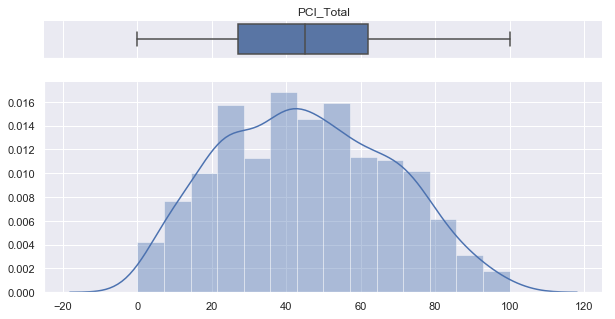

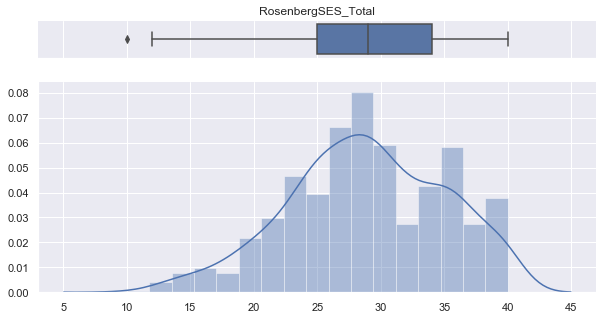

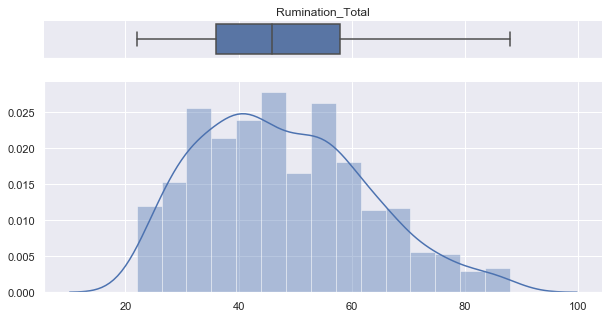

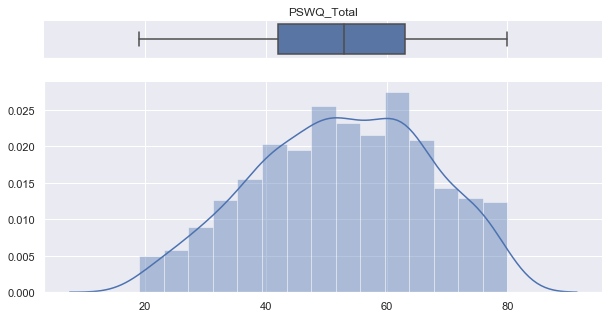

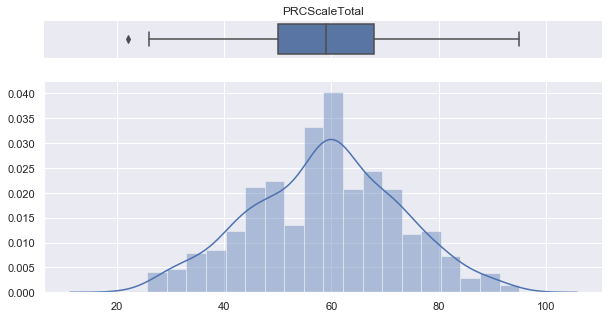

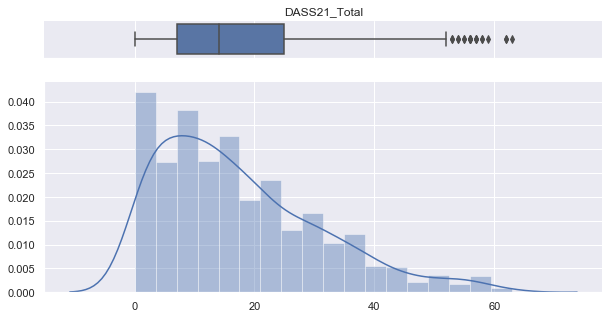

In [12]:
# Check for Outliers
for c in df_new.columns:
    fig, ax = plt.subplots(2, 
                           figsize = (10, 5),
                           sharex = True, 
                           gridspec_kw = {'height_ratios': (0.15, 0.85)})

    ax_box = ax[0]
    ax_box = sns.boxplot(df_new[c], ax = ax_box)
    ax_box.set(title = c, yticks = [], xlabel = '')
    sns.despine(ax = ax_box, left = True)

    ax_hist = ax[1]
    ax_hist = sns.distplot(df_new[c], ax = ax_hist)
    ax_hist.set(xlabel = '')
    sns.despine(ax = ax_hist)

plt.show()

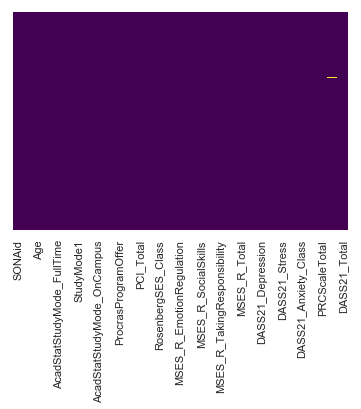

In [13]:
#Check missing data for df
sns.heatmap(df.isnull(),yticklabels=False,cbar=False,cmap='viridis')

In [14]:
#Drop null values found in df_new
df_new.dropna(inplace=True)

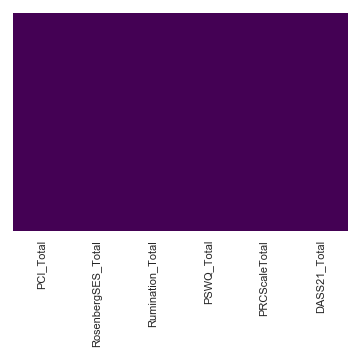

In [15]:
#Check missing data for df_new
sns.heatmap(df_new.isnull(),yticklabels=False,cbar=False,cmap='viridis')

<a id=’Plotly‘></a>

## Visualizations Using Plotly


In [18]:
#Ref: https://medium.com/@ozan/interactive-plots-with-plotly-and-cufflinks-on-pandas-dataframes-af6f86f62d94
#Import Plotly and Cufflinks in Offline Mode
import cufflinks as cf
import plotly.offline


#init_notebook_mode(connected=True)
plotly.offline.init_notebook_mode()
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True, theme='ggplot')

In [17]:
#Interactive Bar Plot of Gender (Males vs Females)
Males = df.Gender[df.Gender == 'Male'].value_counts()
Females = df.Gender[df.Gender == 'Female'].value_counts()

df_Gender = pd.DataFrame([Males,Females])
df_Gender.index = ['Males','Females']
df_Gender.iplot(kind='bar',barmode='stack', bargap =0.5, title='Distribution of Gender (Males vs Females)')


### <font color = blue> Comments: Note significantly more females than males.  This is the nature of a typical Psychology course.   </font>

In [22]:
#Interactive histogram of Students' Ages
df.Age.iplot(kind="histogram", bins=30,  title="Distribution of Students' Ages",xTitle='Ages', yTitle='Count')

In [24]:
#Distribution of Age for each Males vs Females Students

MalesAgesOnly=df.Age[df.Gender == 'Male']
FemalesAgesOnly=df.Age[df.Gender == 'Female']

#df_GenderAges = pd.DataFrame([MalesAgesOnly, FemalesAgesOnly])
#[df_GenderAges.MalesAgesOnly, df_GenderAges.FemaleAgesOnly].iplot(kind="histogram", bins=20, title="Students Ages", xTitle='Ages', yTitle='Count')



#Does Not Work
#df_GenderAges.iplot(kind="histogram", bins=20, title="Distribution of Age for Female Students", xTitle='Ages', yTitle='Count')



In [25]:
MalesAgesOnly.iplot(kind="histogram", bins=20,theme='polar', title="Distribution of Age for Male Students", xTitle='Ages', yTitle='Count')

In [26]:
FemalesAgesOnly.iplot(kind="histogram", bins=20,theme='ggplot', title="Distribution of Age for Female Students", xTitle='Ages', yTitle='Count')


In [27]:
#Interactive Histogram Plot showing Distribution of Age across both Genders 

df["Female Ages"]=df[df["Gender"]=="Female"]["Age"]
df["Male Ages"]=df[df["Gender"]=="Male"]["Age"]

df[["Female Ages","Male Ages"]].iplot(kind="histogram", bins=30, theme="ggplot", title="Students' Age by Gender",
         xTitle='Ages', yTitle='Count')




In [19]:
df.StudyMode1.value_counts(normalize=True)*100

FullTime     54.233655
 PartTime    30.117899
             15.648446
Name: StudyMode1, dtype: float64

In [16]:
#Shows value counts of student's birth country
df.Country.value_counts()

Australia                                               718
                                                        198
Austria                                                   2
Lebanon                                                   2
Philippines                                               1
Indonesia                                                 1
United Kingdom of Great Britain and Northern Ireland      1
Somalia                                                   1
Viet Nam                                                  1
New Zealand                                               1
Sri Lanka                                                 1
Armenia                                                   1
United Arab Emirates                                      1
India                                                     1
Canada                                                    1
Afghanistan                                               1
Algeria                                 

In [97]:
#Interactive Bar Plot of StudyMode1 (Showing students who are "FullTime" vs "PartTime"
StudyMode1_FT = df.AcadStatStudyMode_FullTime.value_counts()
StudyMode1_PT = df.AcadStatStudyMode_PartTime.value_counts()

df_StudyMode1 = pd.DataFrame([StudyMode1_FT, StudyMode1_PT])
df_StudyMode1.index = ['Full-Time','Part-Time']
df_StudyMode1.iplot(kind='bar', barmode='stack', bargap =0.5, title='Distribution of Study Mode 1 - Full Time vs Part Time Students')


In [33]:
df_StudyMode2 = df.StudyMode2.value_counts()
df_StudyMode2

Online            467
                  242
 OnCampus         151
OnlineOnCampus     73
Name: StudyMode2, dtype: int64

In [35]:
df.AcadStatStudyMode_OnCampus.value_counts()

            709
OnCampus    224
Name: AcadStatStudyMode_OnCampus, dtype: int64

In [36]:
df.AcadStatStudyMode_Online.value_counts()

Online    540
          393
Name: AcadStatStudyMode_Online, dtype: int64

In [19]:
#Interactive Bar Plot of StudyMode2 (Showing students who are "OnCampus" vs "Online"


StudyMode2_OC = df.AcadStatStudyMode_OnCampus.value_counts()
StudyMode2_OL = df.AcadStatStudyMode_Online.value_counts()

df_StudyMode2 = pd.DataFrame([StudyMode2_OC, StudyMode2_OL])
df_StudyMode2.index = ['OnCampus','OnLine']
df_StudyMode2.iplot(kind='bar', barmode='stack',bargap =0.5,title='Distribution of Study Mode 2 - OnCampus vs OnLine')



In [28]:
#Boxplot of features:

df_new[['PCI_Total','RosenbergSES_Total', 'Rumination_Total','PSWQ_Total', 'PRCScaleTotal','DASS21_Total']].iplot(kind='box', boxpoints='outliers', title='Boxplots of Features')


In [30]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,933.0,31.927117,10.001129,17.0,24.0,30.0,38.0,73.0
PCI_Total,933.0,45.535906,22.439046,0.0,27.0,45.0,62.0,100.0
RosenbergSES_Total,933.0,28.864952,6.149862,10.0,25.0,29.0,34.0,40.0
Rumination_Total,933.0,47.787781,14.649920,22.0,36.0,46.0,58.0,88.0
MSES_R_EmotionRegulation,933.0,13.852090,6.121410,0.0,9.0,14.0,19.0,24.0
MSES_R_Equanimity,933.0,9.640943,2.979673,1.0,8.0,10.0,12.0,16.0
MSES_R_SocialSkills,933.0,7.391211,2.968759,0.0,5.0,8.0,10.0,12.0
MSES_R_DistressTolerance,933.0,7.980707,2.521932,0.0,6.0,8.0,10.0,12.0
MSES_R_TakingResponsibility,933.0,8.347267,2.349661,0.0,7.0,9.0,10.0,12.0
MSES_R_InterpersonalEffectiveness,933.0,8.949625,2.323751,1.0,8.0,9.0,11.0,12.0


## Correlation Feature Matrix

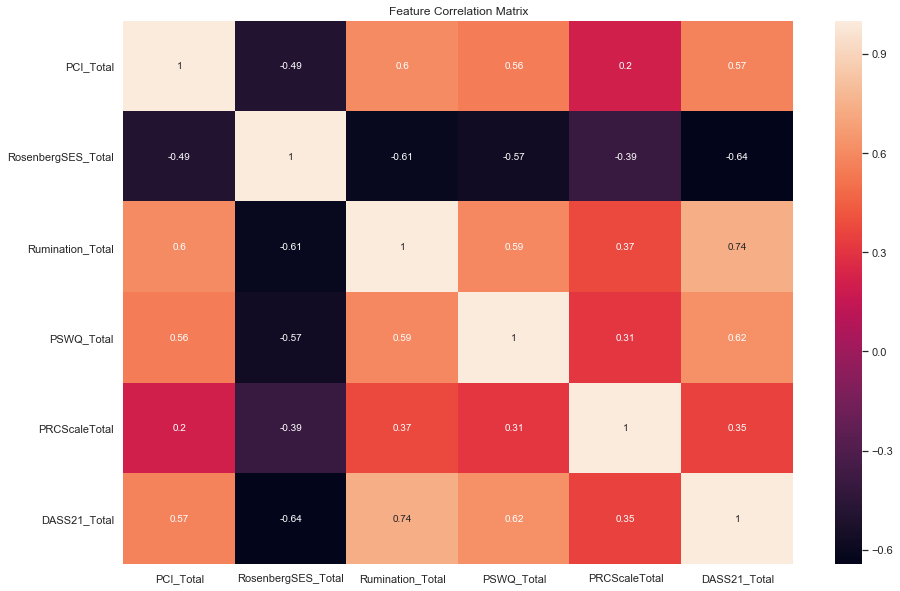

In [20]:
plt.figure(figsize=(15,10))
plt.title('Feature Correlation Matrix')
sns.heatmap((df_new.iloc[:, 0:6]).corr(), annot=True)

In [21]:
#Comment: None of the variables are highly correlated

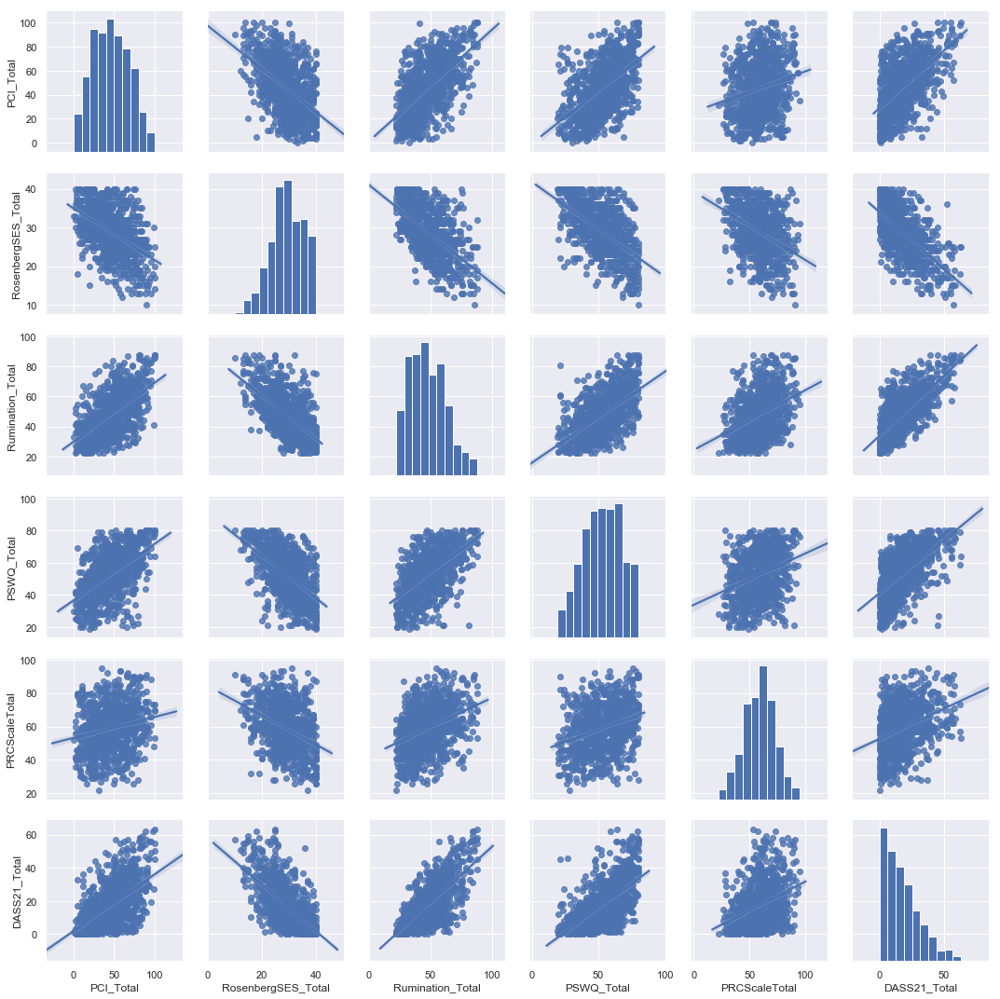

In [24]:
#Pairplot of target and features
sns.pairplot(df_new, kind='reg',palette='coolwarm')



<a id='6'></a>
# Data Preparation

## Defining Features and Target Variable

In [29]:
#Defining the feature set (X) and target variable (y)
#Include 6 features:
X=df_new.iloc[:,0:5] 
y=df_new.iloc[:,5]



## Standardize the Features

In [31]:
#Fit the scaler to our data but NOT including the TARGET class "TargetVariable"

#First, import StandardScaler from Scikit learn 
from sklearn.preprocessing import StandardScaler
#Create an instance of a StandardScaler() object called Sc
Sc = StandardScaler()
#Fit Sc to the features:
Sc.fit(df_new.drop('DASS21_Total', axis=1))

#Use the .transform() method to transform the features to a scaled version:
scaled_features = Sc.transform(df_new.drop('DASS21_Total', axis=1))

#Convert the scaled features to a dataframe and check that the scaling worked.
df_ScaledFeatures = pd.DataFrame(scaled_features, columns=df_new.columns[:-1])
df_ScaledFeatures.head()


#Define X (scaled feature set) and y (targer variable)
X1= df_ScaledFeatures
y1=df_new['DASS21_Total']



## Train Test Split Scaled Features 

In [32]:
#X consists of standardized variables
#y is the target variable
X_train, X_test, y_train, y_test = train_test_split(X1, y1, test_size = 0.3, random_state = 1118, shuffle=True)


<a id='9'></a>
# Model 1: Multiple Linear Regression with Statsmodel

In [33]:
# Model Fit with Statsmodel
#Purpose: To check if feature selection is necessary by checking the p-values of the respective independent variables.

import statsmodels.api as sm

#Adding intercept into the model:
x = sm.add_constant(X_train)
#Fit the OLS Model in Statsmodel:
model = sm.OLS(np.array(y_train), np.array(x)).fit()

In [34]:
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.642
Model:                            OLS   Adj. R-squared:                  0.640
Method:                 Least Squares   F-statistic:                     232.5
Date:                Fri, 03 May 2019   Prob (F-statistic):          7.27e-142
Time:                        01:18:26   Log-Likelihood:                -2264.2
No. Observations:                 653   AIC:                             4540.
Df Residuals:                     647   BIC:                             4567.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         17.5317      0.306     57.383      0.0

In [ ]:
#The results shown in the coefficient table tells us if there is enough statistical evidence that the intercept defers from 0
#Since all the p-values < 0.05, this suggests that all the predictors are significant when predicting DASS21 (i.e.,psychological distress)

In [41]:
#2nd level check - using RFECV to determine if feature selection is necessary:
#SVR with kernel=linear is chosen as it is non-parametric

from sklearn.feature_selection import RFECV
from sklearn.svm import SVR

estimator = SVR(kernel="linear")
selector = RFECV(estimator, step=5, cv=10)
selector = selector.fit(X_train, y_train)
selector_output = pd.DataFrame(data=selector.ranking_, index=X1.columns.values, columns=[['Ranking']])
selector_output['Support'] = selector.support_
selector_output['Ranking'] = selector.ranking_
selector_output.transpose()


,PCI_Total,RosenbergSES_Total,Rumination_Total,PSWQ_Total,PRCScaleTotal
Ranking,1,1,1,1,1
Support,True,True,True,True,True


In [42]:
print(selector.n_features_)

5


In [356]:
#All predictors in output from StatsModel are statistically significant and output from second level check with RFECV suggests that there is no need to select features.  All features will be included for analyses.

<a id='10'></a>
# Model 1: Multiple Linear Regression with Sklearn

##  Fitting Multiple Regression Model And First Evaluation Of The Model using CrossValidation

In [63]:
#Running Multiple Linear Regression with Sklearn for the purpose of :
#1) First evaluation of Model using Cross Validation
#2) Hyperparameter tuning with Gridsearch

LRModel=LinearRegression()

#First evaluation of model using Cross Validation on Training and Test data:


LRModel.fit(X_train, y_train)
r2_LRModel = cross_val_score(estimator=LRModel,X=X_train, y=y_train, scoring='r2',cv=10)
MSE_LRModel = cross_val_score(estimator=LRModel,X=X_train, y=y_train, scoring='mean_squared_error',cv=10)
print(("Mean and (standard deviation) of r2 score for training set after cross-validation : %.3f (%.3f)") % (r2_LRModel.mean(), r2_LRModel.std()))



LRModel.fit(X_test, y_test)
TestScores_LRModel = cross_val_score(estimator=LRModel,X=X_test, y=y_test,scoring='r2',cv=10)
print(("Mean and (standard deviation) of r2 score for test set after cross-validation : %.3f (%.3f)") % (TestScores_LRModel.mean(), TestScores_LRModel.std()))

Mean and (standard deviation) of r2 score for training set after cross-validation : 0.627 (0.029)
Mean and (standard deviation) of r2 score for test set after cross-validation : 0.603 (0.088)


In [64]:
y_train_pred_LRModel = LRModel.predict(X_train)
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred_LRModel))
print("RMSE of training set is {}".format(rmse_train))


RMSE of training set is 7.897394079590664


In [65]:
#Output above suggests our model has high bias, low variance

## Hyperparameter Tuning - Multiple Linear Regression Model

In [739]:
Parameters_LRModel ={'fit_intercept':[True,False], 'normalize':[True,False], 'copy_X':[True, False]}
grid_search = GridSearchCV(estimator = LRModel,
                           param_grid = Parameters_LRModel,
                           cv = 10,
                           n_jobs = -1)
grid_search = grid_search.fit(X_train, y_train)
best_accuracy = grid_search.best_score_
best_parameters = grid_search.best_params_
best_estimator = grid_search.best_estimator_

print("Best accuracy: %.3f "%best_accuracy)
print("-----------------------------")
print("Best parameters are:",best_parameters)
print("-----------------------------")
print("Best estimators are:",best_estimator)

Best accuracy: 0.627 
-----------------------------
Best parameters are: {'copy_X': True, 'fit_intercept': True, 'normalize': True}
-----------------------------
Best estimators are: LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=True)


## Retrain Multiple Linear Regression Model Using Parameters from Grid Search 

In [66]:
LRModel1 = LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=True)
LRModel1.fit(X_train, y_train)
y_pred_LRModel1 = LRModel1.predict(X_test)

## Multiple Linear Regression Model Evaluation

In [67]:
# print the y intercept
print(LRModel1.intercept_)

17.531672105260746


In [50]:
#Coefficients of each feature in the dataset
LRModel1.coef_
#Show the coefficients for each feature
coeff_df = pd.DataFrame(LRModel1.coef_,X1.columns,columns=['Coefficient'])
coeff_df
#Interpretation of the coefficients:
#Holding all other features fixed, a 1 unit increase in PCI_total is associated with an increase of 1.28 in the DASS21Total score.

,Coefficient
PCI_Total,1.282639
RosenbergSES_Total,-3.148444
Rumination_Total,6.017862
PSWQ_Total,1.878868
PRCScaleTotal,0.707412


## Predictions from the Multiple Linear Regression Model

In [68]:
#Examine predictions from out test set and see how well it did
#Use the predict method to grab predictions on X_test
y_pred_LRModel1 = LRModel1.predict(X_test)

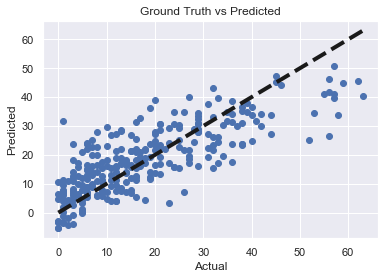

In [52]:
#Visualization of the goodness of the fit with the predictions being visualized by a line
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred_LRModel1)
ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
ax.set_title("Ground Truth vs Predicted")
plt.show()

## Plot Residual Histogram

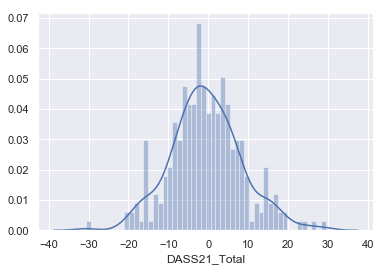

In [73]:
#Plot Residual Histogram
#Create histogram of the distribution of our residuals
# pass y_test - predictions into sns.distplot because residuals = y_test - predictions
#If we have a normal distribution for the residuals, it means our model was a correct choice for the data.

sns.distplot((y_test-y_pred_LRModel1),bins=50);

# Multiple Linear Regression Model Evaluation Metrics

In [69]:
#Evaluation metrics:
#Mean absolute error (MAE) - is just the average error
#Mean squared error (MSE) - MSE "punishes" larger errors, which tends to be useful in the real world.  It takes into account larger errors as it is squaring them
#Root mean square erroe (RMSE) - RMSE is even more popular than MSE, because RMSE is interpretable in the "y" units (or whatever the target is)

print('Root Mean Squared Error (RMSE): %.3f ' %  np.sqrt(metrics.mean_squared_error(y_test, y_pred_LRModel1)))
print('R2 score: %.3f ' % metrics.r2_score(y_test, y_pred_LRModel1))


#R^2 (coefficient of determination) regression score function.



Root Mean Squared Error (RMSE): 8.960 
R2 score: 0.615 


In [54]:
#The RMSE and R2 score suggest the linear model maybe unable to capture the patterns of the data.  It is underfitted.
#To overcome underfitting, we can add transform the original features and add powers to the original features.
#To convert the original features into their higher order terms we will use the PolynomialFeatures class provided by scikit-learn. 
#Since the training and test scores are similar (i.e., consistently inaccurate), we can infer that it is a bias model
#We can increase the complexity of the model b increasing the degree of polynomial
#In what follows, we fit a polynomial curvce of degree 2 to the linear regression model

<a id='11'></a>
## Applying Polynomial Features to Multiple Linear Regression

In [71]:
#Here we define a function which will transform the original features into polynomial features of a given degree and apply Linear Regression on it.

def create_polynomial_regression_model(degree):
  "Creates a polynomial regression model for the given degree"
  
  poly_features = PolynomialFeatures(degree=degree)
  
  # transforms the existing features to higher degree features.
  X_train_poly = poly_features.fit_transform(X_train)
  
  # fit the transformed features to Linear Regression
  poly_model = LRModel1
  poly_model.fit(X_train_poly, y_train)
  
  # predicting on training data-set
  y_train_predicted = poly_model.predict(X_train_poly)
  
  # predicting on test data-set
  y_test_predict = poly_model.predict(poly_features.fit_transform(X_test))
  
  # evaluating the model on training dataset
  rmse_train = np.sqrt(mean_squared_error(y_train, y_train_predicted))
  r2_train = r2_score(y_train, y_train_predicted)
  
  # evaluating the model on test dataset
  rmse_test = np.sqrt(mean_squared_error(y_test, y_test_predict))
  r2_test = r2_score(y_test, y_test_predict)
  
  print("The model performance for the training set")
  print("-------------------------------------------")
  print("RMSE of training set is {}".format(rmse_train))
  print("R2 score of training set is {}".format(r2_train))
  
  print("\n")
  
  print("The model performance for the test set")
  print("-------------------------------------------")
  print("RMSE of test set is {}".format(rmse_test))
  print("R2 score of test set is {}".format(r2_test))






In [72]:
#Call above function with degree as 2
#Print model's performance using polynomial regression:
create_polynomial_regression_model(2)

The model performance for the training set
-------------------------------------------
RMSE of training set is 7.420716934161736
R2 score of training set is 0.6726795592458558


The model performance for the test set
-------------------------------------------
RMSE of test set is 8.880081431256016
R2 score of test set is 0.622011957094995


In [434]:
#Looks like polynomial regression with degree 2 is most optimal and the R2 score has improved slightly and RMSE has decreased slightly.

<a id='12'></a>
# Model 2: Ridge Regression Model
A ridge regression penalises large weights and helps us avoid overfitting to outliers

##  Fitting Ridge Regression Model And First Evaluation Of The Model using CrossValidation

In [73]:

RRModel=Ridge()

RRModel.fit(X_train, y_train)
Scores_RRModel = cross_val_score(estimator=RRModel,X=X_train, y=y_train, scoring='r2',cv=10)
print(("Mean and (standard deviation) of r2 score for training set after cross-validation : %.3f (%.3f)") % (Scores_RRModel.mean(), Scores_RRModel.std()))

RRModel.fit(X_test, y_test)
TestScores_RRModel = cross_val_score(estimator=RRModel,X=X_test, y=y_test,scoring='r2',cv=10)
print(("Mean and (standard deviation) of r2 score for test set after cross-validation : %.3f (%.3f)") % (TestScores_RRModel.mean(), TestScores_RRModel.std()))


Mean and (standard deviation) of r2 score for training set after cross-validation : 0.627 (0.029)
Mean and (standard deviation) of r2 score for test set after cross-validation : 0.603 (0.088)


In [60]:
y_train_pred_RRModel = RRModel.predict(X_train)
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred_RRModel))
print("RMSE of training set is {}".format(rmse_train))

RMSE of training set is 7.89798811264399


In [468]:
#Output above suggests our model has high bias, low variance

## Hyperparameter Tuning - Ridge Regression Model

In [470]:
#Determine alpha for the model using grid search
RRModel=Ridge()

#Original Alphas:
#{'alpha': [100000, 10000, 1000, 100, 1,0.1,0.01,0.001,0.0001, 0.00001, 0.000001]
Parameters_RRModel ={'alpha': range(0,1000,1),
                     'fit_intercept': [True,False],
                     'normalize' :[False, True]}
grid_search = GridSearchCV(estimator = RRModel,
                           param_grid = Parameters_RRModel,
                           cv = 10,
                           n_jobs = -1)
grid_search = grid_search.fit(X_train, y_train)
best_accuracy = grid_search.best_score_
best_parameters = grid_search.best_params_
best_estimator = grid_search.best_estimator_

print("Best accuracy: %.3f "%best_accuracy)
print("-----------------------------")
print("Best parameters are:",best_parameters)
print("-----------------------------")
print("Best estimators are:",best_estimator)

                    

Best accuracy: 0.628 
-----------------------------
Best parameters are: {'alpha': 19, 'fit_intercept': True, 'normalize': False}
-----------------------------
Best estimators are: Ridge(alpha=19, copy_X=True, fit_intercept=True, max_iter=None,
   normalize=False, random_state=None, solver='auto', tol=0.001)


## Retrain Ridge Regression Model Using Parameters from Grid Search

In [74]:
RRModel1 = Ridge(alpha=19, copy_X=True, fit_intercept=True, max_iter=None,
   normalize=False, random_state=None, solver='auto', tol=0.001)

RRModel1.fit(X_train, y_train)

y_pred_RRModel1 = RRModel1.predict(X_test)


## Ridge Regression Model Evaluation

In [75]:
# print the y intercept
print(RRModel1.intercept_)

17.52195829293306


In [63]:
#Coefficients of each feature in the dataset
RRModel1.coef_
#Show the coefficients for each feature
coeff_df = pd.DataFrame(RRModel1.coef_,X1.columns,columns=['Coefficient'])
coeff_df
#Interpretation of the coefficients:
#Holding all other features fixed, a 1 unit increase in PCI_total is associated with an increase of 1.36 in the DASS21Total score.

,Coefficient
PCI_Total,1.360677
RosenbergSES_Total,-3.119701
Rumination_Total,5.763518
PSWQ_Total,1.924547
PRCScaleTotal,0.757475


## Predictions from the Ridge Regression Model

In [76]:
#Examine predictions from out test set and see how well it did
#Use the predict method to grab predictions on X_test
y_pred_RRModel1 = RRModel1.predict(X_test)

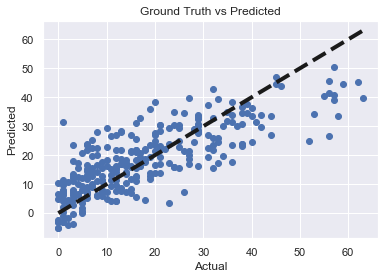

In [97]:
#Visualization of the goodness of the fit with the predictions being visualized by a line
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred_RRModel1)
ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
ax.set_title("Ground Truth vs Predicted")
plt.show()

## Plot Residual Histogram

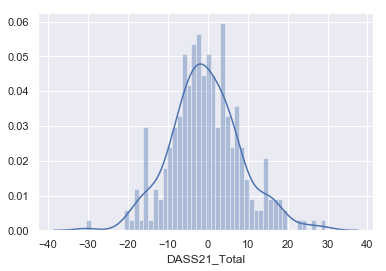

In [98]:
#Create histogram of the distribution of our residuals
#If we have a normal distribution for the residuals, it means our model was a correct choice for the data.

sns.distplot((y_test-y_pred_RRModel1),bins=50);

## Ridge Regression Model Evaluation Metrics

In [77]:
#Evaluation metrics:
#Mean absolute error (MAE) - is just the average error
#Mean squared error (MSE) - MSE "punishes" larger errors, which tends to be useful in the real world.  It takes into account larger errors as it is squaring them
#Root mean square erroe (RMSE) - RMSE is even more popular than MSE, because RMSE is interpretable in the "y" units (or whatever the target is)


print('Root Mean Squared Error (RMSE): %.3f ' %  np.sqrt(metrics.mean_squared_error(y_test, y_pred_RRModel1)))
print('R2 score: %.3f ' % metrics.r2_score(y_test, y_pred_RRModel1))


#R^2 (coefficient of determination) regression score function.


Root Mean Squared Error (RMSE): 8.944 
R2 score: 0.617 


<a id='13'></a>
## Applying Polynomial Features to the Ridge Regression Model

In [ ]:
#Here we define a function which will transform the original features into polynomial features of a given degree and apply Ridge Regression on it.

In [78]:
def create_polynomial_regression_model(degree):
  "Creates a polynomial regression model for the given degree"
  
  poly_features = PolynomialFeatures(degree=degree)
  
  # transforms the existing features to higher degree features.
  X_train_poly = poly_features.fit_transform(X_train)
  
  # fit the transformed features to Linear Regression
  poly_model = RRModel1
  poly_model.fit(X_train_poly, y_train)
  
  # predicting on training data-set
  y_train_predicted = poly_model.predict(X_train_poly)
  
  # predicting on test data-set
  y_test_predict = poly_model.predict(poly_features.fit_transform(X_test))
  
  # evaluating the model on training dataset
  rmse_train = np.sqrt(mean_squared_error(y_train, y_train_predicted))
  r2_train = r2_score(y_train, y_train_predicted)
  
  # evaluating the model on test dataset
  rmse_test = np.sqrt(mean_squared_error(y_test, y_test_predict))
  r2_test = r2_score(y_test, y_test_predict)
  
  print("The model performance for the training set")
  print("-------------------------------------------")
  print("RMSE of training set is {}".format(rmse_train))
  print("R2 score of training set is {}".format(r2_train))
  
  print("\n")
  
  print("The model performance for the test set")
  print("-------------------------------------------")
  print("RMSE of test set is {}".format(rmse_test))
  print("R2 score of test set is {}".format(r2_test))

In [79]:
#Call above function with degree as 2
#Print model's performance using polynomial regression:
create_polynomial_regression_model(2)

The model performance for the training set
-------------------------------------------
RMSE of training set is 7.425611109975846
R2 score of training set is 0.6722476624171885


The model performance for the test set
-------------------------------------------
RMSE of test set is 8.830117380486891
R2 score of test set is 0.6262535134604785


In [67]:
#Looks like polynomial regression with degree 2 is most optimal and the R2 score has improved slightly and RMSE has decreased slightly.

<a id='14'></a>
# Model 3: Lasso Regression

##  Fitting Lasso Regression Model And First Evaluation Of The Model using CrossValidation!

In [80]:
LModel=Lasso()

LModel.fit(X_train, y_train)
Scores_LModel = cross_val_score(estimator=LModel,X=X_train, y=y_train, scoring='r2',cv=10)
print(("Mean and (standard deviation) of r2 score for training set after cross-validation : %.3f (%.3f)") % (Scores_LModel.mean(), Scores_LModel.std()))

LModel.fit(X_test, y_test)
TestScores_LModel = cross_val_score(estimator=LModel,X=X_test, y=y_test,scoring='r2',cv=10)
print(("Mean and (standard deviation) of r2 score for test set after cross-validation : %.3f (%.3f)") % (TestScores_LModel.mean(), TestScores_LModel.std()))

Mean and (standard deviation) of r2 score for training set after cross-validation : 0.617 (0.034)
Mean and (standard deviation) of r2 score for test set after cross-validation : 0.600 (0.089)


In [81]:
y_train_pred_LModel = LModel.predict(X_train)
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred_LModel))
print("RMSE of training set is {}".format(rmse_train))

RMSE of training set is 7.955608297814794


In [70]:
#Output above suggests our model has high bias, low variance

## Hyperparameter Tuning - Lasso Regression Model

In [509]:
LModel=Lasso()
LModel
#Original Alphas:
#{'alpha':  [0.001,0.0001, 0.00001, 0.000001]
Parameters_LModel ={'alpha':[0.00008,0.0009,0.001],
                     'fit_intercept': [True,False],
                     'normalize' :[False, True]}
grid_search = GridSearchCV(estimator = LModel,
                           param_grid = Parameters_LModel,
                           cv = 10,
                           n_jobs = -1)
grid_search = grid_search.fit(X_train, y_train)
best_accuracy = grid_search.best_score_
best_parameters = grid_search.best_params_
best_estimator = grid_search.best_estimator_

print("Best accuracy: %.3f "%best_accuracy)
print("-----------------------------")
print("Best parameters are:",best_parameters)
print("-----------------------------")
print("Best estimators are:",best_estimator)

Best accuracy: 0.627 
-----------------------------
Best parameters are: {'alpha': 0.0009, 'fit_intercept': True, 'normalize': True}
-----------------------------
Best estimators are: Lasso(alpha=0.0009, copy_X=True, fit_intercept=True, max_iter=1000,
   normalize=True, positive=False, precompute=False, random_state=None,
   selection='cyclic', tol=0.0001, warm_start=False)


## Retrain Lasso Regression Model Using Parameters from Grid Search 

In [82]:
LModel1 = Lasso(alpha=0.0009, copy_X=True, fit_intercept=True, max_iter=1000,
   normalize=True, positive=False, precompute=False, random_state=None,
   selection='cyclic', tol=0.0001, warm_start=False)
LModel1.fit(X_train, y_train)

y_pred_LModel1 = LModel1.predict(X_test)

In [72]:
# print the y intercept
print(LModel1.intercept_)

17.530586710885956


In [73]:
#Coefficients of each feature in the dataset
LModel1.coef_
#Show the coefficients for each feature
coeff_df = pd.DataFrame(LModel1.coef_,X1.columns,columns=['Coefficient'])
coeff_df
#Interpretation of the coefficients:
#Holding all other features fixed, a 1 unit increase in PCI_total is associated with an increase of 1.27 in the DASS21Total score.

,Coefficient
PCI_Total,1.270991
RosenbergSES_Total,-3.143866
Rumination_Total,6.013907
PSWQ_Total,1.871077
PRCScaleTotal,0.692173


## Predictions from the Multiple Linear Regression Model

In [74]:
#Show the coefficients for each feature
coeff_df = pd.DataFrame(LModel1.coef_,X1.columns,columns=['Coefficient'])
coeff_df

,Coefficient
PCI_Total,1.270991
RosenbergSES_Total,-3.143866
Rumination_Total,6.013907
PSWQ_Total,1.871077
PRCScaleTotal,0.692173


## Predictions from the Lasso  Regression Model

In [83]:
#Examine predictions from our test set and see how well it did
#Use the predict method to grab predictions on X_test
y_pred_LModel1 = LModel1.predict(X_test)

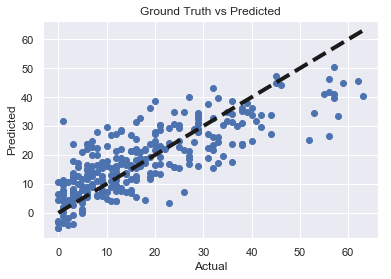

In [77]:
#Visualization of the goodness of the fit with the predictions being visualized by a line
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred_LModel1)
ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
ax.set_title("Ground Truth vs Predicted")
plt.show()

## Plot Residual Histogram

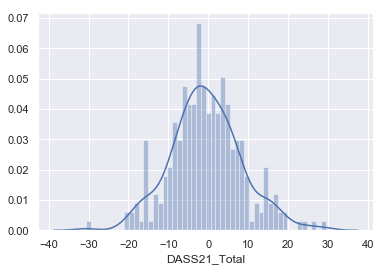

In [112]:
#Plot Residual Histogram
#Create histogram of the distribution of our residuals
# pass y_test - predictions into sns.distplot because residuals = y_test - predictions
#If we have a normal distribution for the residuals, it means our model was a correct choice for the data.

sns.distplot((y_test-y_pred_LRModel1),bins=50);

## Lasso Regression Model Evaluation Metrics

In [84]:
#Evaluation metrics:
#Mean absolute error (MAE) - is just the average error
#Mean squared error (MSE) - MSE "punishes" larger errors, which tends to be useful in the real world.  It takes into account larger errors as it is squaring them
#Root mean square erroe (RMSE) - RMSE is even more popular than MSE, because RMSE is interpretable in the "y" units (or whatever the target is)

print('Root Mean Squared Error (RMSE): %.3f ' %  np.sqrt(metrics.mean_squared_error(y_test, y_pred_LModel1)))
print('R2 score: %.3f ' % metrics.r2_score(y_test, y_pred_LModel1))

#R^2 (coefficient of determination) regression score function.


Root Mean Squared Error (RMSE): 8.959 
R2 score: 0.615 


<a id='15'></a>
## Applying Polynomial Features to Lasso Regression Model

In [85]:
#Here we define a function which will transform the original features into polynomial features of a given degree and apply Lasso Regression on it.


def create_polynomial_regression_model(degree):
  "Creates a polynomial regression model for the given degree"
  
  poly_features = PolynomialFeatures(degree=degree)
  
  # transforms the existing features to higher degree features.
  X_train_poly = poly_features.fit_transform(X_train)
  
  # fit the transformed features to Linear Regression
  poly_model = LModel1
  poly_model.fit(X_train_poly, y_train)
  
  # predicting on training data-set
  y_train_predicted = poly_model.predict(X_train_poly)
  
  # predicting on test data-set
  y_test_predict = poly_model.predict(poly_features.fit_transform(X_test))
  
  # evaluating the model on training dataset
  rmse_train = np.sqrt(mean_squared_error(y_train, y_train_predicted))
  r2_train = r2_score(y_train, y_train_predicted)
  
  # evaluating the model on test dataset
  rmse_test = np.sqrt(mean_squared_error(y_test, y_test_predict))
  r2_test = r2_score(y_test, y_test_predict)
  
  print("The model performance for the training set")
  print("-------------------------------------------")
  print("RMSE of training set is {}".format(rmse_train))
  print("R2 score of training set is {}".format(r2_train))
  
  print("\n")
  
  print("The model performance for the test set")
  print("-------------------------------------------")
  print("RMSE of test set is {}".format(rmse_test))
  print("R2 score of test set is {}".format(r2_test))

In [121]:
#Call above function with degree as 2
#Print model's performance using polynomial regression:
create_polynomial_regression_model(2)

#Looks like polynomial regression with degree 2 is most optimal and the R2 score has improved slightly and RMSE has decreased slightly.

The model performance for the training set
-------------------------------------------
RMSE of training set is 7.422124058585732
R2 score of training set is 0.6725554137600108


The model performance for the test set
-------------------------------------------
RMSE of test set is 8.851961002655345
R2 score of test set is 0.6244021054755589


<a id='16'></a>
## Model 4: Elastic Net Regresssion
Elastic Net combines the Ridge and Lasso regularization penalties

##  Fitting the Elastic Net Regression Model And First Evaluation Of The Model

In [86]:

ENModel=ElasticNet()

ENModel.fit(X_train, y_train)
Scores_ENModel = cross_val_score(estimator=ENModel,X=X_train, y=y_train, scoring='r2',cv=10)
print(("Mean and (standard deviation) of r2 score for training set after cross-validation : %.3f (%.3f)") % (Scores_ENModel.mean(), Scores_ENModel.std()))

ENModel.fit(X_test, y_test)
TestScores_ENModel = cross_val_score(estimator=ENModel,X=X_test, y=y_test,scoring='r2',cv=10)
print(("Mean and (standard deviation) of r2 score for test set after cross-validation : %.3f (%.3f)") % (TestScores_ENModel.mean(), TestScores_ENModel.std()))

Mean and (standard deviation) of r2 score for training set after cross-validation : 0.595 (0.029)
Mean and (standard deviation) of r2 score for test set after cross-validation : 0.588 (0.086)


In [87]:
y_train_pred_ENModel = ENModel.predict(X_train)
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred_ENModel))
print("RMSE of training set is {}".format(rmse_train))

RMSE of training set is 8.18586696797172


In [544]:
#Output above suggests our model has high bias, low variance

## Hyperparameter Tuning - Elastic Net Regression Model

In [549]:
#Determine alpha for the model using grid search
ENModel=ElasticNet()

#Original Alphas:
#{'alpha': [100000, 10000, 1000, 100, 1,0.1,0.01,0.001,0.0001, 0.00001, 0.000001]
Parameters_ENModel ={'alpha': [0.01,0.02,0.04,0.05,0.06,0.07,0.08,0.09],
                     'fit_intercept': [True,False],
                     'normalize' :[False, True]}
grid_search = GridSearchCV(estimator = ENModel,
                           param_grid = Parameters_ENModel,
                           cv = 10,
                           n_jobs = -1)
grid_search = grid_search.fit(X_train, y_train)
best_accuracy = grid_search.best_score_
best_parameters = grid_search.best_params_
best_estimator = grid_search.best_estimator_

print("Best accuracy: %.3f "%best_accuracy)
print("-----------------------------")
print("Best parameters are:",best_parameters)
print("-----------------------------")
print("Best estimators are:",best_estimator)

Best accuracy: 0.628 
-----------------------------
Best parameters are: {'alpha': 0.06, 'fit_intercept': True, 'normalize': False}
-----------------------------
Best estimators are: ElasticNet(alpha=0.06, copy_X=True, fit_intercept=True, l1_ratio=0.5,
      max_iter=1000, normalize=False, positive=False, precompute=False,
      random_state=None, selection='cyclic', tol=0.0001, warm_start=False)


## Retrain Elastic Net Regression Model Using Parameters from Grid Search

In [88]:
ENModel1 = ElasticNet(alpha=0.06, copy_X=True, fit_intercept=True, l1_ratio=0.5,
      max_iter=1000, normalize=False, positive=False, precompute=False,
      random_state=None, selection='cyclic', tol=0.0001, warm_start=False)

ENModel1.fit(X_train, y_train)

y_pred_ENModel1 = ENModel1.predict(X_test)

## Multiple Linear Regression Model Evaluation

In [83]:
# print the y intercept
print(ENModel1.intercept_)

17.520235236410503


In [84]:
#Coefficients of each feature in the dataset
ENModel1.coef_
#Show the coefficients for each feature
coeff_df = pd.DataFrame(ENModel1.coef_,X1.columns,columns=['Coefficient'])
coeff_df
#Interpretation of the coefficients:
#Holding all other features fixed, a 1 unit increase in PCI_total is associated with an increase of 1.35 in the DASS21Total score.

,Coefficient
PCI_Total,1.348586
RosenbergSES_Total,-3.112389
Rumination_Total,5.749699
PSWQ_Total,1.914668
PRCScaleTotal,0.740226


## Predictions from the Elastic Net Regression Model

In [89]:
#Examine predictions from our test set and see how well it did
#Use the predict method to grab predictions on X_test
y_pred_ENModel1 = ENModel1.predict(X_test)


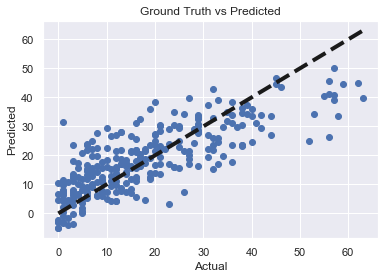

In [666]:
#Visualization of the goodness of the fit with the predictions being visualized by a line
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred_ENModel1)
ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
ax.set_title("Ground Truth vs Predicted")
plt.show()

## Plot Residual Histogram

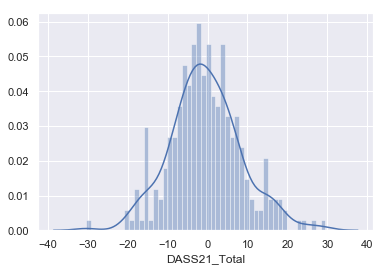

In [559]:
#Plot Residual Histogram
#Create histogram of the distribution of our residuals
# pass y_test - predictions into sns.distplot because residuals = y_test - predictions
#If we have a normal distribution for the residuals, it means our model was a correct choice for the data.

sns.distplot((y_test-y_pred_ENModel1),bins=50);

## Elastic Net Regression Model Evaluation Metrics

In [90]:
#Evaluation metrics:
#Mean absolute error (MAE) - is just the average error
#Mean squared error (MSE) - MSE "punishes" larger errors, which tends to be useful in the real world.  It takes into account larger errors as it is squaring them
#Root mean square erroe (RMSE) - RMSE is even more popular than MSE, because RMSE is interpretable in the "y" units (or whatever the target is)

print('Root Mean Squared Error (RMSE): %.3f ' %  np.sqrt(metrics.mean_squared_error(y_test, y_pred_ENModel1)))
print('R2 score: %.3f ' % metrics.r2_score(y_test, y_pred_ENModel1))

# Explained variance score: 1 is perfect prediction
#R^2 (coefficient of determination) regression score function.

Root Mean Squared Error (RMSE): 8.943 
R2 score: 0.617 


<a id='17'></a>
## Applying Polynomial Features to Elastic Net Regression Model

In [91]:
#Here we define a function which will transform the original features into polynomial features of a given degree and apply Elastic Net Regression on it.

def create_polynomial_regression_model(degree):
  "Creates a polynomial regression model for the given degree"
  
  poly_features = PolynomialFeatures(degree=degree)
  
  # transforms the existing features to higher degree features.
  X_train_poly = poly_features.fit_transform(X_train)
  
  # fit the transformed features to Linear Regression
  poly_model = ENModel1
  poly_model.fit(X_train_poly, y_train)
  
  # predicting on training data-set
  y_train_predicted = poly_model.predict(X_train_poly)
  
  # predicting on test data-set
  y_test_predict = poly_model.predict(poly_features.fit_transform(X_test))
  
  # evaluating the model on training dataset
  rmse_train = np.sqrt(mean_squared_error(y_train, y_train_predicted))
  r2_train = r2_score(y_train, y_train_predicted)
  
  # evaluating the model on test dataset
  rmse_test = np.sqrt(mean_squared_error(y_test, y_test_predict))
  r2_test = r2_score(y_test, y_test_predict)
  
  print("The model performance for the training set")
  print("-------------------------------------------")
  print("RMSE of training set is {}".format(rmse_train))
  print("R2 score of training set is {}".format(r2_train))
  
  print("\n")
  
  print("The model performance for the test set")
  print("-------------------------------------------")
  print("RMSE of test set is {}".format(rmse_test))
  print("R2 score of test set is {}".format(r2_test))

In [88]:
#Call above function with degree as 3
#Print model's performance using polynomial regression:
create_polynomial_regression_model(3)

#Looks like polynomial regression with degree 2 is most optimal and the R2 score has improved slightly and RMSE has decreased slightly.

The model performance for the training set
-------------------------------------------
RMSE of training set is 7.2487432697990055
R2 score of training set is 0.6876749392057055


The model performance for the test set
-------------------------------------------
RMSE of test set is 8.803542761479592
R2 score of test set is 0.6284997406418628


<a id='18'></a>
# Model 5: Stochastic Gradient Descent Regressor

##  Fitting Stochastic Gradient Descent Regressor Model And First Evaluation Of The Model using CrossValidation

In [92]:
#First evaluation of model using Cross Validation on Training and Test data:
SGDModel=SGDRegressor() 


SGDModel.fit(X_train, y_train)
Scores_SGDModel = cross_val_score(estimator=SGDModel,X=X_train, y=y_train, scoring='r2',cv=10)
print(("Mean and (standard deviation) of r2 score for training set after cross-validation : %.3f (%.3f)") % (Scores_SGDModel.mean(), Scores_SGDModel.std()))

SGDModel.fit(X_test, y_test)
TestScores_SGDModel = cross_val_score(estimator=SGDModel,X=X_test, y=y_test,scoring='r2',cv=10)
print(("Mean and (standard deviation) of r2 score for test set after cross-validation : %.3f (%.3f)") % (TestScores_SGDModel.mean(), TestScores_SGDModel.std()))


Mean and (standard deviation) of r2 score for training set after cross-validation : 0.627 (0.028)
Mean and (standard deviation) of r2 score for test set after cross-validation : 0.599 (0.079)


In [137]:
y_train_pred_SGDModel = SGDModel.predict(X_train)
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred_SGDModel))
print("RMSE of training set is {}".format(rmse_train))

RMSE of training set is 7.959951963725408


## Hyperparameter Tuning - Stochastic Gradient Descent Regressor Model

In [787]:
Parameters_SGDModel ={
    'loss': ['squared_loss','huber'],
    'penalty': [ 'l1', 'elasticnet'],
    'alpha': [10 ** x for x in range(-6, 1)],
    'l1_ratio': [0, 0.05, 0.1, 0.2, 0.5, 0.8, 0.9, 0.95, 1]}



grid_search = GridSearchCV(estimator = SGDModel,
                           param_grid = Parameters_SGDModel,
                           cv = 10,
                           n_jobs = -1)
grid_search = grid_search.fit(X_train, y_train)
best_accuracy = grid_search.best_score_
best_parameters = grid_search.best_params_
best_estimator = grid_search.best_estimator_

print("Best accuracy: %.3f "%best_accuracy)
print("-----------------------------")
print("Best parameters are:",best_parameters)
print("-----------------------------")
print("Best estimators are:",best_estimator)

Best accuracy: 0.628 
-----------------------------
Best parameters are: {'alpha': 0.0001, 'l1_ratio': 0.95, 'loss': 'squared_loss', 'penalty': 'elasticnet'}
-----------------------------
Best estimators are: SGDRegressor(alpha=0.0001, average=False, epsilon=0.1, eta0=0.01,
       fit_intercept=True, l1_ratio=0.95, learning_rate='invscaling',
       loss='squared_loss', max_iter=None, n_iter=None,
       penalty='elasticnet', power_t=0.25, random_state=None, shuffle=True,
       tol=None, verbose=0, warm_start=False)


## Retrain Stochastic Gradient Descent Regressor Model Using Parameters from Grid Search

In [93]:
SGDModel1 = SGDRegressor(alpha=0.0001, average=False, epsilon=0.1, eta0=0.01,
       fit_intercept=True, l1_ratio=0.95, learning_rate='invscaling',
       loss='squared_loss', max_iter=None, n_iter=None,
       penalty='elasticnet', power_t=0.25, random_state=None, shuffle=True,
       tol=None, verbose=0, warm_start=False)
SGDModel1.fit(X_train, y_train)
y_pred_SGDModel1 = SGDModel1.predict(X_test)

## Stochastic Gradient Descent Regressor Model Evaluation

In [139]:
# print the y intercept
print(SGDModel1.intercept_)

[17.43376489]


In [140]:
#Coefficients of each feature in the dataset
SGDModel1.coef_
#Show the coefficients for each feature
coeff_df = pd.DataFrame(SGDModel1.coef_,X1.columns,columns=['Coefficient'])
coeff_df
#Interpretation of the coefficients:
#Holding all other features fixed, a 1 unit increase in PCI_total is associated with an increase of 1.28 in the DASS21Total score.

,Coefficient
PCI_Total,1.375945
RosenbergSES_Total,-3.139359
Rumination_Total,5.490721
PSWQ_Total,1.982310
PRCScaleTotal,0.778641


## Predictions from the Stochastic Gradient Descent Regressor Model

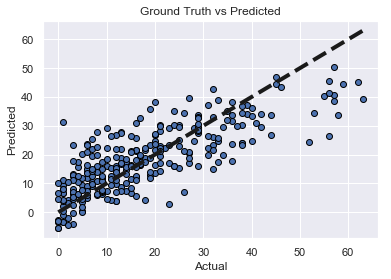

In [944]:
#Examine predictions from our test set and see how well it did
#Use the predict method to grab predictions on X_test
y_pred_SGDModel1 = SGDModel1.predict(X_test)

#Visualization of the goodness of the fit with the predictions being visualized by a line
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred_SGDModel1, edgecolors=(0, 0, 0))
ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
ax.set_title("Ground Truth vs Predicted")
plt.show()

## Plot Residual Histogram

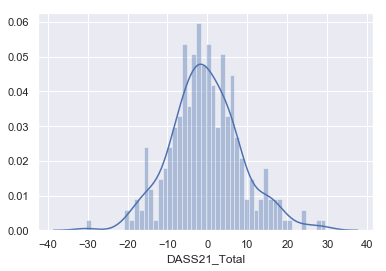

In [945]:
#Plot Residual Histogram
#Create histogram of the distribution of our residuals
# pass y_test - predictions into sns.distplot because residuals = y_test - predictions
#If we have a normal distribution for the residuals, it means our model was a correct choice for the data.

sns.distplot((y_test-y_pred_SGDModel1),bins=50);

## Stochastic Gradient Descent Regressor  Evaluation Metrics

In [94]:
#Evaluation metrics:
#Mean absolute error (MAE) - is just the average error
#Mean squared error (MSE) - MSE "punishes" larger errors, which tends to be useful in the real world.  It takes into account larger errors as it is squaring them
#Root mean square erroe (RMSE) - RMSE is even more popular than MSE, because RMSE is interpretable in the "y" units (or whatever the target is)

print('Root Mean Squared Error (RMSE): %.3f ' %  np.sqrt(metrics.mean_squared_error(y_test, y_pred_SGDModel1)))
print('R2 score: %.3f ' % metrics.r2_score(y_test, y_pred_SGDModel1))

Root Mean Squared Error (RMSE): 8.924 
R2 score: 0.618 


<a id='19'></a>
# Model 6: Support Vector Regression Model

##  Fitting Multiple Regression Model And First Evaluation Of The Model using CrossValidation

In [95]:

#First evaluation of model using Cross Validation on Training and Test data:
SVRModel=SVR()


SVRModel.fit(X_train, y_train)
Scores_SVRModel = cross_val_score(estimator=SVRModel,X=X_train, y=y_train, scoring='r2',cv=10)
print(("Mean and (standard deviation) of r2 score for training set after cross-validation : %.3f (%.3f)") % (Scores_SVRModel.mean(), Scores_SVRModel.std()))

SVRModel.fit(X_test, y_test)
TestScores_SVRModel = cross_val_score(estimator=SVRModel,X=X_test, y=y_test,scoring='r2',cv=10)
print(("Mean and (standard deviation) of r2 score for test set after cross-validation : %.3f (%.3f)") % (TestScores_SVRModel.mean(), TestScores_SVRModel.std()))

Mean and (standard deviation) of r2 score for training set after cross-validation : 0.577 (0.054)
Mean and (standard deviation) of r2 score for test set after cross-validation : 0.459 (0.062)


In [96]:
y_train_pred_SVRModel = SVRModel.predict(X_train)
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred_SVRModel))
print("RMSE of training set is {}".format(rmse_train))

RMSE of training set is 8.96879335656166


## Hyperparameter Tuning - Support Vector Regression Model

In [943]:
Parameters_SVRModel = [
{'C': [0.1, 1, 10, 100, 1000], 'kernel': ['linear'], 'gamma': [0.1, 0.2, 0.3, 0.4, 0.5]}, 
 {'C': [0.1, 1, 10, 100, 1000], 'kernel': ['rbf'], 'gamma': [0.1, 0.2, 0.3, 0.4, 0.5]},
  {'C': [0.1, 1, 10, 100, 1000], 'kernel': ['poly'], 'gamma': [0.1, 0.2, 0.3, 0.4, 0.5]},
  {'C': [0.1, 1, 10, 100, 1000], 'kernel': ['sigmoid'], 'gamma': [0.1, 0.2, 0.3, 0.4, 0.5]}
]
                     
          

grid_search = GridSearchCV(estimator = SVRModel,
                           param_grid = Parameters_SVRModel,
                           cv = 10,
                           n_jobs = -1)
grid_search = grid_search.fit(X_train, y_train)
best_accuracy = grid_search.best_score_
best_parameters = grid_search.best_params_
best_estimator = grid_search.best_estimator_

print("Best accuracy: %.3f "%best_accuracy)
print("-----------------------------")
print("Best parameters are:",best_parameters)
print("-----------------------------")
print("Best estimators are:",best_estimator)

Best accuracy: 0.634 
-----------------------------
Best parameters are: {'C': 10, 'gamma': 0.2, 'kernel': 'rbf'}
-----------------------------
Best estimators are: SVR(C=10, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma=0.2,
  kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False)


In [941]:
# Original Parameters_SVRModel:
#     [{'C': [0.1, 1, 10, 100, 1000], 'kernel': ['linear'], 'gamma': [0.1, 0.2, 0.3, 0.4, 0.5]}, 
#     {'C': [0.1, 1, 10, 100, 1000], 'kernel': ['rbf'], 'gamma': [0.1, 0.2, 0.3, 0.4, 0.5]}]


Parameters_SVRModel = [{'C': range(10,20), 'kernel': ['rbf'], 'gamma': [0.001,0.007,0.008,0.009, 0.01,0.02,0.03,0.04,0.05]}] 
                     
          

grid_search = GridSearchCV(estimator = SVRModel,
                           param_grid = Parameters_SVRModel,
                           cv = 10,
                           n_jobs = -1)
grid_search = grid_search.fit(X_train, y_train)
best_accuracy = grid_search.best_score_
best_parameters = grid_search.best_params_
best_estimator = grid_search.best_estimator_

print("Best accuracy: %.3f "%best_accuracy)
print("-----------------------------")
print("Best parameters are:",best_parameters)
print("-----------------------------")
print("Best estimators are:",best_estimator)

Best accuracy: 0.644 
-----------------------------
Best parameters are: {'C': 18, 'gamma': 0.02, 'kernel': 'rbf'}
-----------------------------
Best estimators are: SVR(C=18, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma=0.02,
  kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False)


## Retrain Support Vector Regression Model Using Parameters from Grid Search

In [97]:
SVRModel1 = SVR(C=18, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma=0.02,
  kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False)

SVRModel1.fit(X_train, y_train)
y_pred_SVRModel1 = SVRModel1.predict(X_test)

## Support Vector Regression Model Evaluation

In [98]:
# print the y intercept
print(SVRModel1.intercept_)

[18.94495176]


In [99]:
#Cannot see coefficients as coef_ is only available when using a linear kernel

## Predictions from the Support Vector Regression Model

In [100]:
#Examine predictions from our test set and see how well it did
#Use the predict method to grab predictions on X_test
y_pred_SVRModel1 = SVRModel1.predict(X_test)

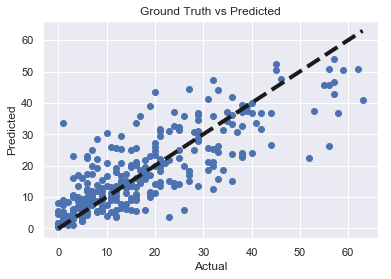

In [152]:
#Visualization of the goodness of the fit with the predictions being visualized by a line
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred_SVRModel1)
ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
ax.set_title("Ground Truth vs Predicted")
plt.show()

## Plot Residual Histogram

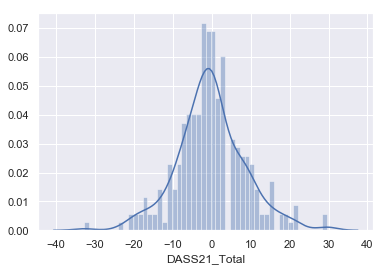

In [153]:
#Plot Residual Histogram
#Create histogram of the distribution of our residuals
# pass y_test - predictions into sns.distplot because residuals = y_test - predictions
#If we have a normal distribution for the residuals, it means our model was a correct choice for the data.

sns.distplot((y_test-y_pred_SVRModel1),bins=50);

## Support Vector Regression Model Evaluation Metrics

In [101]:
#Evaluation metrics:
#Mean absolute error (MAE) - is just the average error
#Mean squared error (MSE) - MSE "punishes" larger errors, which tends to be useful in the real world.  It takes into account larger errors as it is squaring them
#Root mean square erroe (RMSE) - RMSE is even more popular than MSE, because RMSE is interpretable in the "y" units (or whatever the target is)

print('Root Mean Squared Error (RMSE): %.3f ' %  np.sqrt(metrics.mean_squared_error(y_test, y_pred_SVRModel1)))
print('R2 score: %.3f ' % metrics.r2_score(y_test, y_pred_SVRModel1))

#R^2 (coefficient of determination) regression score function.

Root Mean Squared Error (RMSE): 8.767 
R2 score: 0.632 


In [35]:
#Try Non-parametric Model next

<a id='20'></a>
# Model 7: K-Nearest Neighbors Regressor

##  Fitting K-Nearest Neighbors Regressor Model And First Evaluation Of The Model using CrossValidation

In [102]:

#First evaluation of model using Cross Validation on Training and Test data:
KNNRModel=KNeighborsRegressor()

KNNRModel.fit(X_train, y_train)
Scores_KNNRModel = cross_val_score(estimator=KNNRModel,X=X_train, y=y_train, scoring='r2',cv=10)
print(("Mean and (standard deviation) of r2 score for training set after cross-validation : %.3f (%.3f)") % (Scores_KNNRModel.mean(), Scores_KNNRModel.std()))

KNNRModel.fit(X_test, y_test)
TestScores_KNNRModel = cross_val_score(estimator=KNNRModel,X=X_test, y=y_test,scoring='r2',cv=10)
print(("Mean and (standard deviation) of r2 score for test set after cross-validation : %.3f (%.3f)") % (TestScores_KNNRModel.mean(), TestScores_KNNRModel.std()))

Mean and (standard deviation) of r2 score for training set after cross-validation : 0.594 (0.066)
Mean and (standard deviation) of r2 score for test set after cross-validation : 0.557 (0.099)


In [156]:
y_train_pred_KNNRModel = KNNRModel.predict(X_train)
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred_KNNRModel))
print("RMSE of training set is {}".format(rmse_train))

RMSE of training set is 8.760764544594226


## Choosing a K Value for K-Nearest Neighbors Regressor Model

In [630]:
#First examine the error rates for the various k values:

rmse_val = [] #to store rmse values for different k
for K in range(30):
    K = K+1
    model = KNeighborsRegressor(n_neighbors = K)
    model.fit(X_train, y_train)  #fit the model
    pred=model.predict(X_test) #make prediction on test set
    error = sqrt(mean_squared_error(y_test,pred)) #calculate rmse
    rmse_val.append(error) #store rmse values
    print('RMSE value for k= ' , K , 'is:', error)

RMSE value for k=  1 is: 11.694473664330271
RMSE value for k=  2 is: 10.14994722013019
RMSE value for k=  3 is: 9.720845707542182
RMSE value for k=  4 is: 9.615045873154072
RMSE value for k=  5 is: 9.598005745242826
RMSE value for k=  6 is: 9.36924955914759
RMSE value for k=  7 is: 9.317441871676474
RMSE value for k=  8 is: 9.22372898231977
RMSE value for k=  9 is: 9.21399279027989
RMSE value for k=  10 is: 9.227511272586682
RMSE value for k=  11 is: 9.209276481765086
RMSE value for k=  12 is: 9.177370644386356
RMSE value for k=  13 is: 9.197709801681206
RMSE value for k=  14 is: 9.18334962580943
RMSE value for k=  15 is: 9.15811635862393
RMSE value for k=  16 is: 9.148738386384212
RMSE value for k=  17 is: 9.127886632982323
RMSE value for k=  18 is: 9.122155641347803
RMSE value for k=  19 is: 9.106537569990724
RMSE value for k=  20 is: 9.042594641868165
RMSE value for k=  21 is: 9.053726903628199
RMSE value for k=  22 is: 9.012396765264246
RMSE value for k=  23 is: 9.042490913015246
R

Text(0,0.5,'Error Rate')

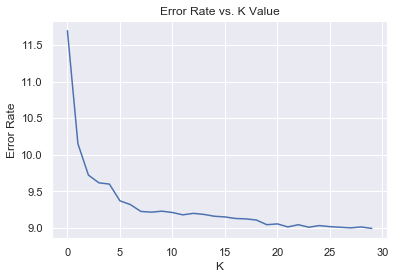

In [631]:
#plotting the rmse values against k values
elbowcurve = pd.DataFrame(rmse_val) #elbow curve 
elbowcurve.plot(legend=None)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')

## Hyperparameter Tuning - K-Nearest Neighbors Regressor Model

In [633]:
Parameters_KNNRModel = {'n_neighbors': range(1,30),'weights':['uniform', 'distance'], 'metric':['euclidean','manhattan']}

grid_search = GridSearchCV(estimator = KNNRModel,
                           param_grid = Parameters_KNNRModel,
                           verbose = 1,
                           cv = 10,
                           n_jobs = -1)
grid_search = grid_search.fit(X_train, y_train)
best_accuracy = grid_search.best_score_
best_parameters = grid_search.best_params_
best_estimator = grid_search.best_estimator_

print("Best accuracy: %.3f "%best_accuracy)
print("-----------------------------")
print("Best parameters are:",best_parameters)
print("-----------------------------")
print("Best estimators are:",best_estimator)

Fitting 10 folds for each of 116 candidates, totalling 1160 fits


[Parallel(n_jobs=-1)]: Done 764 tasks      | elapsed:    4.6s


Best accuracy: 0.636 
-----------------------------
Best parameters are: {'metric': 'manhattan', 'n_neighbors': 24, 'weights': 'distance'}
-----------------------------
Best estimators are: KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='manhattan',
          metric_params=None, n_jobs=1, n_neighbors=24, p=2,
          weights='distance')


[Parallel(n_jobs=-1)]: Done 1160 out of 1160 | elapsed:    7.4s finished


## Retrain K-Nearest Neighbors Regressor Model Using Parameters from Grid Search

In [103]:
KNNRModel1 = KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='manhattan',
          metric_params=None, n_jobs=1, n_neighbors=24, p=2,
          weights='distance')
KNNRModel1.fit(X_train, y_train)
y_pred_KNNRModel1  = KNNRModel1.predict(X_test)

## K-Nearest Neighbors Regressor Model Evaluation

In [104]:
#Examine predictions from our test set and see how well it did
#Use the predict method to grab predictions on X_test
y_pred_KNNRModel1 = KNNRModel1.predict(X_test)

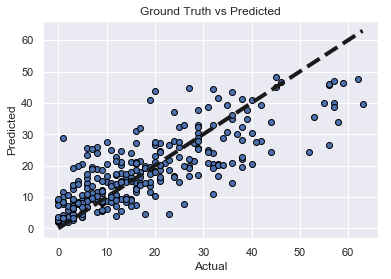

In [648]:
#Visualization of the goodness of the fit with the predictions being visualized by a line
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred_KNNRModel1, edgecolors=(0, 0, 0))
ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
ax.set_title("Ground Truth vs Predicted")
plt.show()

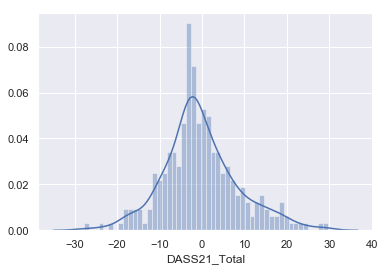

In [642]:
#Plot Residual Histogram
#Create histogram of the distribution of our residuals
# pass y_test - predictions into sns.distplot because residuals = y_test - predictions
#If we have a normal distribution for the residuals, it means our model was a correct choice for the data.

sns.distplot((y_test-y_pred_KNNRModel1),bins=50);

## K-Nearest Neighbors Regressor Model Evaluation Metrics

In [105]:
#Evaluation metrics:
#Mean absolute error (MAE) - is just the average error
#Mean squared error (MSE) - MSE "punishes" larger errors, which tends to be useful in the real world.  It takes into account larger errors as it is squaring them
#Root mean square erroe (RMSE) - RMSE is even more popular than MSE, because RMSE is interpretable in the "y" units (or whatever the target is)

print('Root Mean Squared Error (RMSE): %.3f ' %  np.sqrt(metrics.mean_squared_error(y_test, y_pred_KNNRModel1)))
print('R2 score: %.3f ' % metrics.r2_score(y_test, y_pred_KNNRModel1))

#R^2 (coefficient of determination) regression score function.

Root Mean Squared Error (RMSE): 8.931 
R2 score: 0.618 


<a id='21'></a>
# Model 8: Random Forest Regressor


##  Fitting Random Forest Regressor Model And First Evaluation Of The Model

In [106]:
RFRModel=RandomForestRegressor(random_state=1118)

RFRModel.fit(X_train, y_train)
Scores_RFRModel = cross_val_score(estimator=RFRModel,X=X_train, y=y_train, scoring='r2',cv=10)
print(("Mean and (standard deviation) of r2 score for training set after cross-validation : %.3f (%.3f)") % (Scores_RFRModel.mean(), Scores_RFRModel.std()))

RFRModel.fit(X_test, y_test)
TestScores_RFRModel = cross_val_score(estimator=RFRModel,X=X_test, y=y_test,scoring='r2',cv=10)
print(("Mean and (standard deviation) of r2 score for test set after cross-validation : %.3f (%.3f)") % (TestScores_RFRModel.mean(), TestScores_RFRModel.std()))


Mean and (standard deviation) of r2 score for training set after cross-validation : 0.581 (0.070)
Mean and (standard deviation) of r2 score for test set after cross-validation : 0.511 (0.112)


In [107]:
y_train_pred_RFRModel = RFRModel.predict(X_train)
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred_RFRModel))
print("RMSE of training set is {}".format(rmse_train))

RMSE of training set is 8.653333679410968


## Hyperparameter Tuning - Random Forest Regressor Model

In [953]:
RFRModel=RandomForestRegressor(random_state=1118)


# Original Parameters = {"n_estimators": [10,100,500],
#     "max_depth": range (3,7),
#     "max_features": [1, 3, 5],
#     "min_samples_split": [10,15,20],
#     "min_samples_leaf": [1, 3, 10],
#     "bootstrap": [True, False]}

Parameters_RFRModel = {"n_estimators": [400,500,600,700,800,900],
    "max_depth": [7,8,9],
    "max_features":[1,2,3],
    "min_samples_split": [20,25,30,35,40],
    "min_samples_leaf": [1,2,3],
    "bootstrap": [True, False]}


grid_search = GridSearchCV(estimator = RFRModel,
                           param_grid = Parameters_RFRModel,
                           cv = 10,
                           n_jobs = -1)

grid_search = grid_search.fit(X_train, y_train)
best_accuracy = grid_search.best_score_
best_parameters = grid_search.best_params_
best_estimator = grid_search.best_estimator_

print("Best accuracy: %.3f "%best_accuracy)
print("-----------------------------")
print("Best parameters are:",best_parameters)
print("-----------------------------")
print("Best estimators are:",best_estimator)

Best accuracy: 0.639 
-----------------------------
Best parameters are: {'bootstrap': True, 'max_depth': 8, 'max_features': 2, 'min_samples_leaf': 1, 'min_samples_split': 25, 'n_estimators': 500}
-----------------------------
Best estimators are: RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=8,
           max_features=2, max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=25, min_weight_fraction_leaf=0.0,
           n_estimators=500, n_jobs=1, oob_score=False, random_state=1118,
           verbose=0, warm_start=False)


## Retrain Random Forest Regressor Model Using Parameters from Grid Search 

In [108]:
RFRModel1 = RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=8,
           max_features=2, max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=25, min_weight_fraction_leaf=0.0,
           n_estimators=500, n_jobs=1, oob_score=False, random_state=1118,
           verbose=0, warm_start=False)

RFRModel1.fit(X_train, y_train)



RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=8,
           max_features=2, max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=25, min_weight_fraction_leaf=0.0,
           n_estimators=500, n_jobs=1, oob_score=False, random_state=1118,
           verbose=0, warm_start=False)

## Random Forest Regressor Model Evaluation

## Predictions from the Random Forest Regressor Model

In [109]:
#Examine predictions from our test set and see how well it did
#Use the predict method to grab predictions on X_test
y_pred_RFRModel1 = RFRModel1.predict(X_test)

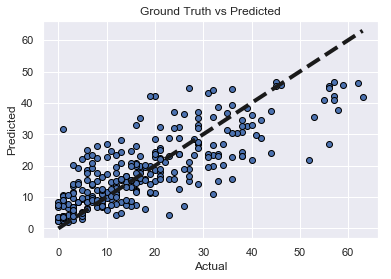

In [42]:
#Visualization of the goodness of the fit with the predictions being visualized by a line
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred_RFRModel1, edgecolors=(0, 0, 0))
ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
ax.set_title("Ground Truth vs Predicted")
plt.show()

## Plot Residual Histogram

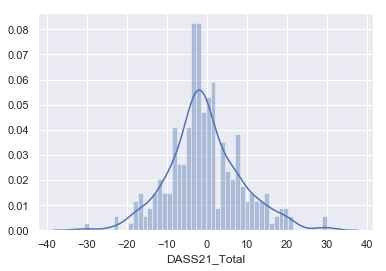

In [962]:
#Plot Residual Histogram
#Create histogram of the distribution of our residuals
# pass y_test - predictions into sns.distplot because residuals = y_test - predictions
#If we have a normal distribution for the residuals, it means our model was a correct choice for the data.

sns.distplot((y_test-y_pred_RFRModel1),bins=50);

## Random Forest Regressor Model Evaluation Metrics

In [110]:
#Evaluation metrics:
#Mean absolute error (MAE) - is just the average error
#Mean squared error (MSE) - MSE "punishes" larger errors, which tends to be useful in the real world.  It takes into account larger errors as it is squaring them
#Root mean square erroe (RMSE) - RMSE is even more popular than MSE, because RMSE is interpretable in the "y" units (or whatever the target is)

print('Root Mean Squared Error (RMSE): %.3f ' %  np.sqrt(metrics.mean_squared_error(y_test, y_pred_RFRModel1)))
print('R2 score: %.3f ' % metrics.r2_score(y_test, y_pred_RFRModel1))

#R^2 (coefficient of determination) regression score function.

Root Mean Squared Error (RMSE): 8.967 
R2 score: 0.615 


## Interpreting the Random Forest Regressor Model

In [166]:
feature_import = pd.DataFrame(data=RFRModel1.feature_importances_, index=X1.columns.values, columns=['values'])
feature_import.sort_values(['values'], ascending=False, inplace=True)
feature_import.transpose()


,Rumination_Total,RosenbergSES_Total,PSWQ_Total,PCI_Total,PRCScaleTotal
values,0.436647,0.242794,0.184089,0.093171,0.043299


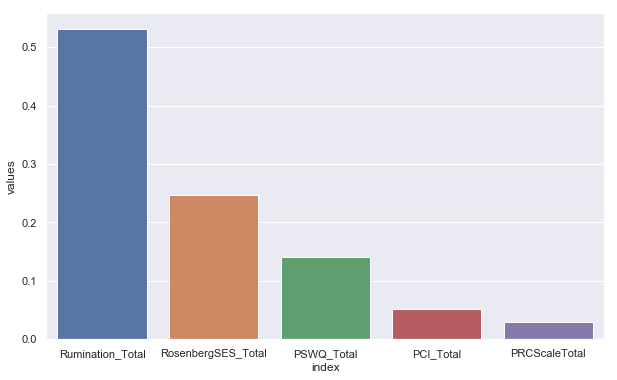

In [744]:
#Tells us which features are most important in explaining the Target Variable
plt.figure(figsize=(10,6))
feature_import.reset_index(level=0, inplace=True)
sns.barplot(x='index', y='values', data=feature_import, palette='deep')
plt.show()

In [44]:
#It appears that the top 3 most important features are 1) Rumination, 2) Self-Esteem and 3) Worry for the random forest regressor model.

<a id='22'></a>
# Model 9 : XGBoost Regressor


##  Fitting XGBoost Regressor And First Evaluation Of The Model using CrossValidation

In [111]:
#First evaluation of model using Cross Validation on Training and Test data:
XGBModel=XGBRegressor(random_state=1118)


XGBModel.fit(X_train, y_train)
Scores_XGBModel = cross_val_score(estimator=XGBModel,X=X_train, y=y_train, scoring='r2',cv=10)
print(("Mean and (standard deviation) of r2 score for training set after cross-validation : %.3f (%.3f)") % (Scores_XGBModel.mean(), Scores_XGBModel.std()))

XGBModel.fit(X_test, y_test)
TestScores_XGBModel = cross_val_score(estimator=XGBModel,X=X_test, y=y_test,scoring='r2',cv=10)
print(("Mean and (standard deviation) of r2 score for test set after cross-validation : %.3f (%.3f)") % (TestScores_XGBModel.mean(), TestScores_XGBModel.std()))

Mean and (standard deviation) of r2 score for training set after cross-validation : 0.623 (0.062)
Mean and (standard deviation) of r2 score for test set after cross-validation : 0.493 (0.095)


In [112]:
y_train_pred_XGBModel = XGBModel.predict(X_train)
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred_XGBModel))
print("RMSE of training set is {}".format(rmse_train))

RMSE of training set is 8.380937197963394


## Hyperparameter Tuning - XGBoost Regressor Model

In [719]:
#Hyperparameter Tuning Part 2:

XGBModel = xgb.XGBRegressor(random_state=1118)


Parameters_XGBModel ={'learning_rate':[0.1,0.3],
 'n_estimators':[500],
 'max_depth':[1,3,5],
 'min_child_weight':[4,5,6],
 'gamma':[0.1,1],
 'subsample':[0.8],
 'colsample_bytree':[0.5,0.8,1.0],
 'nthread':[4],
 'scale_pos_weight':[1],
 'seed':[1118]}


grid_search = GridSearchCV(estimator = XGBModel,
                           param_grid = Parameters_XGBModel,
                           cv = 5,
                           n_jobs = -1)

grid_search = grid_search.fit(X_train, y_train)
best_accuracy = grid_search.best_score_
best_parameters = grid_search.best_params_
best_estimator = grid_search.best_estimator_

print("Best accuracy: %.3f "%best_accuracy)
print("-----------------------------")
print("Best parameters are:",best_parameters)
print("-----------------------------")
print("Best estimators are:",best_estimator)


Best accuracy: 0.631 
-----------------------------
Best parameters are: {'colsample_bytree': 0.8, 'gamma': 0.1, 'learning_rate': 0.1, 'max_depth': 1, 'min_child_weight': 4, 'n_estimators': 500, 'nthread': 4, 'scale_pos_weight': 1, 'seed': 1118, 'subsample': 0.8}
-----------------------------
Best estimators are: XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.8, gamma=0.1, importance_type='gain',
       learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=4, missing=None, n_estimators=500, n_jobs=1,
       nthread=4, objective='reg:linear', random_state=1118, reg_alpha=0,
       reg_lambda=1, scale_pos_weight=1, seed=1118, silent=True,
       subsample=0.8)


## Retrain XGBoost Regressor Model Using Parameters from Grid Search

In [113]:
XGBModel1 = XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.8, gamma=0.1, importance_type='gain',
       learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=4, missing=None, n_estimators=500, n_jobs=1,
       nthread=4, objective='reg:linear', random_state=1118, reg_alpha=0,
       reg_lambda=1, scale_pos_weight=1, seed=1118, silent=True,
       subsample=0.8)

XGBModel1.fit(X_train, y_train)



XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.8, gamma=0.1, importance_type='gain',
       learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=4, missing=None, n_estimators=500, n_jobs=1,
       nthread=4, objective='reg:linear', random_state=1118, reg_alpha=0,
       reg_lambda=1, scale_pos_weight=1, seed=1118, silent=True,
       subsample=0.8)

## XGBoost Regressor Model Evaluation

## Predictions from the XGBoost Regressor Model

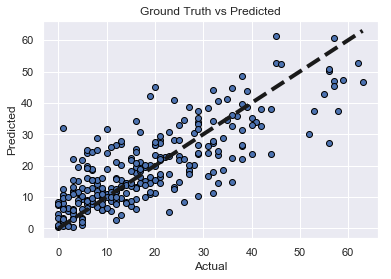

In [50]:
#Examine predictions from our test set and see how well it did
#Use the predict method to grab predictions on X_test
y_pred_XGBModel1 = XGBModel1.predict(X_test)

#Visualization of the goodness of the fit with the predictions being visualized by a line
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred_XGBModel1, edgecolors=(0, 0, 0))
ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
ax.set_title("Ground Truth vs Predicted")
plt.show()

In [168]:
## Plot Residual Histogram

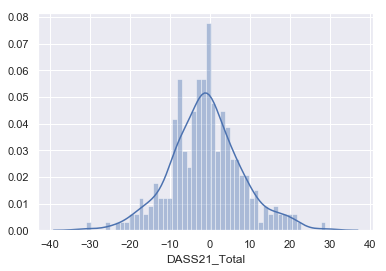

In [746]:
#Plot Residual Histogram
#Create histogram of the distribution of our residuals
# pass y_test - predictions into sns.distplot because residuals = y_test - predictions
#If we have a normal distribution for the residuals, it means our model was a correct choice for the data.

sns.distplot((y_test-y_pred_XGBModel1),bins=50);

## XGBoost Model Regressor Evaluation Metrics

## Predictions from the XGBoost Regressor Model

In [114]:
#Evaluation metrics:
#Mean absolute error (MAE) - is just the average error
#Mean squared error (MSE) - MSE "punishes" larger errors, which tends to be useful in the real world.  It takes into account larger errors as it is squaring them
#Root mean square erroe (RMSE) - RMSE is even more popular than MSE, because RMSE is interpretable in the "y" units (or whatever the target is)

y_pred_XGBModel1 = XGBModel1.predict(X_test)

print('Root Mean Squared Error (RMSE): %.3f ' %  np.sqrt(metrics.mean_squared_error(y_test, y_pred_XGBModel1)))
print('R2 score: %.3f ' % metrics.r2_score(y_test, y_pred_XGBModel1))

#R^2 (coefficient of determination) regression score function.

Root Mean Squared Error (RMSE): 8.897 
R2 score: 0.621 


<a id='23'></a>
# Model 10: Gradient Boosting Regressor

In [115]:
#First evaluation of model using Cross Validation on Training and Test data:
GBModel=GradientBoostingRegressor(random_state=1118)

GBModel.fit(X_train, y_train)
Scores_GBModel = cross_val_score(estimator=GBModel,X=X_train, y=y_train, scoring='r2',cv=10)
print(("Mean and (standard deviation) of r2 score for training set after cross-validation : %.3f (%.3f)") % (Scores_GBModel.mean(), Scores_GBModel.std()))

GBModel.fit(X_test, y_test)
TestScores_GBModel = cross_val_score(estimator=GBModel,X=X_test, y=y_test,scoring='r2',cv=10)
print(("Mean and (standard deviation) of r2 score for test set after cross-validation : %.3f (%.3f)") % (TestScores_GBModel.mean(), TestScores_GBModel.std()))

Mean and (standard deviation) of r2 score for training set after cross-validation : 0.620 (0.064)
Mean and (standard deviation) of r2 score for test set after cross-validation : 0.476 (0.097)


In [116]:
y_train_pred_GBModel = GBModel.predict(X_train)
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred_GBModel))
print("RMSE of training set is {}".format(rmse_train))

RMSE of training set is 8.634660295834115


## Hyperparameter Tuning - Gradient Boosting Regressor

In [757]:
# Original Parameters Parameters_GBModel= {
#         'n_estimators': [500,1000],
#         'max_features': [1,3,5],
#         'max_depth': [2,4,6,8,10],
#         'learning_rate': [0.1, 0.05, 0.02, 0.01


Parameters_GBModel= {
        'n_estimators': [100,300,500],
        'max_features': [1,2,3],
        'max_depth': [1,2,3,4,5],
        'learning_rate': [0.0001,0.001,0.01,0.1]}
grid_search = GridSearchCV(estimator = GBModel,
                           param_grid = Parameters_GBModel,
                           cv = 10,
                           n_jobs = -1)
grid_search = grid_search.fit(X_train, y_train)
best_accuracy = grid_search.best_score_
best_parameters = grid_search.best_params_
best_estimator = grid_search.best_estimator_

print("Best accuracy: %.3f "%best_accuracy)
print("-----------------------------")
print("Best parameters are:",best_parameters)
print("-----------------------------")
print("Best estimators are:",best_estimator)

Best accuracy: 0.635 
-----------------------------
Best parameters are: {'learning_rate': 0.01, 'max_depth': 4, 'max_features': 2, 'n_estimators': 300}
-----------------------------
Best estimators are: GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None,
             learning_rate=0.01, loss='ls', max_depth=4, max_features=2,
             max_leaf_nodes=None, min_impurity_decrease=0.0,
             min_impurity_split=None, min_samples_leaf=1,
             min_samples_split=2, min_weight_fraction_leaf=0.0,
             n_estimators=300, presort='auto', random_state=1118,
             subsample=1.0, verbose=0, warm_start=False)


## Retrain Gradient Boosting Regressor Model Using Parameters from Grid Search

In [117]:
GBRModel1 = GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None,
             learning_rate=0.01, loss='ls', max_depth=4, max_features=2,
             max_leaf_nodes=None, min_impurity_decrease=0.0,
             min_impurity_split=None, min_samples_leaf=1,
             min_samples_split=2, min_weight_fraction_leaf=0.0,
             n_estimators=300, presort='auto', random_state=1118,
             subsample=1.0, verbose=0, warm_start=False)
GBRModel1.fit(X_train, y_train)
y_pred_GBRModel1 = GBRModel1.predict(X_test)

## Predictions from the Gradient Boosting Regressor Model 

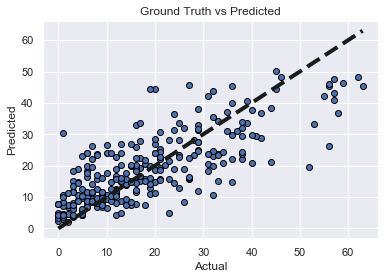

In [946]:
#Examine predictions from our test set and see how well it did
#Use the predict method to grab predictions on X_test
y_pred_GBRModel1 = GBRModel1.predict(X_test)

#Visualization of the goodness of the fit with the predictions being visualized by a line
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred_GBRModel1, edgecolors=(0, 0, 0))
ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
ax.set_title("Ground Truth vs Predicted")
plt.show()

## Plot Residual Histogram

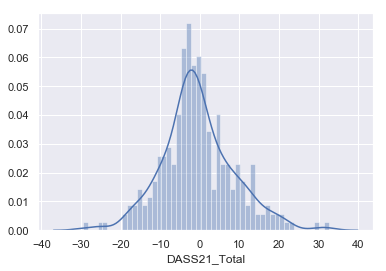

In [947]:
#Plot Residual Histogram
#Create histogram of the distribution of our residuals
# pass y_test - predictions into sns.distplot because residuals = y_test - predictions
#If we have a normal distribution for the residuals, it means our model was a correct choice for the data.

sns.distplot((y_test-y_pred_GBRModel1),bins=50);

## Gradient Boosting Regressor Model Evaluation Metrics

In [119]:
#Evaluation metrics:
#Mean absolute error (MAE) - is just the average error
#Mean squared error (MSE) - MSE "punishes" larger errors, which tends to be useful in the real world.  It takes into account larger errors as it is squaring them
#Root mean square erroe (RMSE) - RMSE is even more popular than MSE, because RMSE is interpretable in the "y" units (or whatever the target is)

print('Root Mean Squared Error (RMSE): %.3f ' %  np.sqrt(metrics.mean_squared_error(y_test, y_pred_GBRModel1)))
print('R2 score: %.3f ' % metrics.r2_score(y_test, y_pred_GBRModel1))



Root Mean Squared Error (RMSE): 9.114 
R2 score: 0.602 


# Model 11: Decision Tree

## Fitting Decision Tree Model And First Evaluation Of The Model using CrossValidation

In [805]:
#Try last model 

#First evaluation of model using Cross Validation on Training and Test data:
DTModel=DecisionTreeRegressor()

DTModel.fit(X1, y1)
AllDataScores_DTModel = cross_val_score(estimator=DTModel,X=X1, y=y1, scoring='r2',cv=10)
print(("Mean and (standard deviation) of r2 score for ALL data after cross-validation : %.3f (%.3f)") % (AllDataScores_DTModel.mean(), AllDataScores_DTModel.std()))

DTModel.fit(X_train, y_train)
Scores_DTModel = cross_val_score(estimator=DTModel,X=X_train, y=y_train, scoring='r2',cv=10)
print(("Mean and (standard deviation) of r2 score for training set after cross-validation : %.3f (%.3f)") % (Scores_DTModel.mean(), Scores_DTModel.std()))

DTModel.fit(X_test, y_test)
TestScores_DTModel = cross_val_score(estimator=DTModel,X=X_test, y=y_test,scoring='r2',cv=10)
print(("Mean and (standard deviation) of r2 score for test set after cross-validation : %.3f (%.3f)") % (TestScores_DTModel.mean(), TestScores_DTModel.std()))

Mean and (standard deviation) of r2 score for ALL data after cross-validation : -1.340 (0.828)
Mean and (standard deviation) of r2 score for training set after cross-validation : 0.232 (0.127)
Mean and (standard deviation) of r2 score for test set after cross-validation : 0.265 (0.189)


In [807]:
#r2 scores for Decision Tree are low as compared to other models which suggests that the decision tree may not be a suitable model.

<a id='24'></a>
# Summary of Results for Each Model:



In [120]:
#Linear Regression
print('Linear Regression')
print('Root Mean Squared Error (RMSE): %.3f ' %  np.sqrt(metrics.mean_squared_error(y_test, y_pred_LRModel1)))
print('R2 score: %.3f ' % metrics.r2_score(y_test, y_pred_LRModel1))

print('\n')

#Ridge Regression
print('Ridge Regression')
print('Root Mean Squared Error (RMSE): %.3f ' %  np.sqrt(metrics.mean_squared_error(y_test, y_pred_RRModel1)))
print('R2 score: %.3f ' % metrics.r2_score(y_test, y_pred_RRModel1))
print('\n')

#Lasso Regression
print('Lasso Regression')
print('Root Mean Squared Error (RMSE): %.3f ' %  np.sqrt(metrics.mean_squared_error(y_test, y_pred_LModel1)))
print('R2 score: %.3f ' % metrics.r2_score(y_test, y_pred_LModel1))

print('\n')

#Support Vector Regression
print('Support Vector Regression')
print('Root Mean Squared Error (RMSE): %.3f ' %  np.sqrt(metrics.mean_squared_error(y_test, y_pred_SVRModel1)))
print('R2 score: %.3f ' % metrics.r2_score(y_test, y_pred_SVRModel1))
print('\n')

#KNN Regression
print('K-Nearest Neighbors Regression')
print('Root Mean Squared Error (RMSE): %.3f ' %  np.sqrt(metrics.mean_squared_error(y_test, y_pred_KNNRModel1)))
print('R2 score: %.3f ' % metrics.r2_score(y_test, y_pred_KNNRModel1))
print('\n')


#Random Forest Regression
print('Random Forest Regression')
print('Root Mean Squared Error (RMSE): %.3f ' %  np.sqrt(metrics.mean_squared_error(y_test, y_pred_RFRModel1)))
print('R2 score: %.3f ' % metrics.r2_score(y_test, y_pred_RFRModel1))

print('\n')

#XGBoost
print('Random Forest Regression')
print('Root Mean Squared Error (RMSE): %.3f ' %  np.sqrt(metrics.mean_squared_error(y_test, y_pred_XGBModel1)))
print('R2 score: %.3f ' % metrics.r2_score(y_test, y_pred_XGBModel1))

print('\n')

#Gradient Boost Regressor
print('Gradient Boost Regression')
print('Root Mean Squared Error (RMSE): %.3f ' %  np.sqrt(metrics.mean_squared_error(y_test, y_pred_GBRModel1)))
print('R2 score: %.3f ' % metrics.r2_score(y_test, y_pred_GBRModel1))
print('\n')

#Stochastic Gradient Descent Regressor
print('Stochastic Gradient Descent Regression')
print('Root Mean Squared Error (RMSE): %.3f ' %  np.sqrt(metrics.mean_squared_error(y_test, y_pred_SGDModel1)))
print('R2 score: %.3f ' % metrics.r2_score(y_test, y_pred_SGDModel1))


Linear Regression
Root Mean Squared Error (RMSE): 8.960 
R2 score: 0.615 


Ridge Regression
Root Mean Squared Error (RMSE): 8.944 
R2 score: 0.617 


Lasso Regression
Root Mean Squared Error (RMSE): 8.959 
R2 score: 0.615 


Support Vector Regression
Root Mean Squared Error (RMSE): 8.767 
R2 score: 0.632 


K-Nearest Neighbors Regression
Root Mean Squared Error (RMSE): 8.931 
R2 score: 0.618 


Random Forest Regression
Root Mean Squared Error (RMSE): 8.967 
R2 score: 0.615 


Random Forest Regression
Root Mean Squared Error (RMSE): 8.897 
R2 score: 0.621 


Gradient Boost Regression
Root Mean Squared Error (RMSE): 9.114 
R2 score: 0.602 


Stochastic Gradient Descent Regression
Root Mean Squared Error (RMSE): 8.924 
R2 score: 0.618 


In [56]:
#Plotting the RMSE Scores and R2 Scores for Each Model

In [57]:
#Import collated scores into a dataframe
df_scores=pd.read_csv('RegressionScoresSummary.csv')


In [58]:
df_scores.head()

,Model,TrainRMSE,TrainR2Score,TestRMSE,TestR2Score
0,Linear Regression,7.897,0.627,8.960,0.615
1,Polynomial Regression With Linear Model,7.420,0.673,8.880,0.622
2,Ridge Regression,7.898,0.627,8.944,0.617
3,Polynomial Regression With Ridge Model,7.426,0.672,8.830,0.626
4,Lasso Regression,7.956,0.617,8.959,0.615


<a id='25'></a>
# Plot of Test RMSE Scores for Each Model

In [189]:
df_scores.iplot(mode='lines+markers+text',y='TestRMSE',x='Model',
    yTitle='RMSE Score',
    title='Test RMSE for Each Model',theme='solar',color='red')

<a id='26'></a>
# Plot of Test R2 Scores for Each Model

In [190]:
df_scores.iplot(mode='lines+markers+text',y='TestR2Score',x='Model',
    yTitle='r2 Score',
    title='Test r2 Scores for Each Model', theme='solar',color='gold')

<a id='Conclusion'></a>
# Conclusion

<br>Data collected from a sample of ACAP psychology students was explored and modeled to predict psychological distress using measures of perfectionistic cognitions, worry, rumination and self-esteem.  
<br>10 models were developed and compared using two metrics - Root Mean Squared Error (RMSE) and R2.  
<br>The model giving the lowest RMSE (8.767) and the highest R2 (0.632) was the Support Vector Regression model using the Radial Basis Function (rbf) kernel. 
<br>
<br>This suggests that linear models may not be suited for the current dataset.


<a id='27'></a>
# References

<br>Flett, G. L., Hewitt, P. L., & Mikail, F. (2017). Perfectionism: A relational approach to conceptualization, assessment and treatment. New York: The Guildford Press.
<br>
<br>Lay, C. (1986).  At last, my research article on procrastination.  Journal of Research in Personality, 20, 474-495.
<br>
<br>Meyer, T.J., Miller, M.L., Metzger, R. L., & Borkovec, T. D. (1990). Development and validation of the Penn State Worry Questionnaire, Behavioural Research and Therapy. 28, 6, 487-495.
<br>
<br>Rosenberg, M. (1965). Society and the adolescent self-image. Princeton, NJ: Princeton University Press. 
<br>
<br>Treynor, W., Gonzalez, R., & Nolen-Hoeksema, S. (2003). Rumination Reconsidered: A Psychometric Analysis. Cognitive Therapy and Research, 27, 3, 247–259.
<br>
<br>Lovibond, S.H. & Lovibond, P.F. (1995). Manual for the Depression Anxiety & Stress Scales. (2nd Ed.) Sydney: Psychology Foundation.
